In [1]:
#importing the required pandas libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#importing the warnings 
import warnings
warnings.filterwarnings("ignore")

In [3]:
#current application data
df=pd.read_csv("application_data.csv")
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
#Determining the shape of the dataset
df.shape

(307511, 122)

In [5]:
#reading the categorical columns 
df.select_dtypes(include = "object").columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

In [6]:
#reading the numerical columns
df.select_dtypes(include = ["int","float"]).columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)

In [7]:
#Getting the statistical data of dataframe
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [8]:
#Getting the structure of the dataset
df.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [9]:
#checking the datatype of each columns
df.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

In [10]:
##checking the null values columns
df.columns[df.isnull().any()]

Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'OWN_CAR_AGE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMI

In [11]:
##checking the sum of null values
df.isnull().values.sum()

9152465

In [12]:
##length of null columns
len(df.columns[df.isnull().any()])

67

There are total 67 columns having null values

In [13]:
#lets count the null values percentage in each columns
null_count=df.isnull().sum()
null_count_percentage=round((df.isnull().sum()/df.shape[0])*100,2)

In [14]:
##creating dict that gives us the null column name and percentage of null count as well
null_df=pd.DataFrame({'column_name':df.columns,"null_count":null_count,"null_count_percentage":null_count_percentage})
null_df.reset_index(drop=True,inplace=True)

In [15]:
null_df.sort_values(by="null_count_percentage",ascending=False)

,column_name,null_count,null_count_percentage
76,COMMONAREA_MEDI,214865,69.87
48,COMMONAREA_AVG,214865,69.87
62,COMMONAREA_MODE,214865,69.87
70,NONLIVINGAPARTMENTS_MODE,213514,69.43
56,NONLIVINGAPARTMENTS_AVG,213514,69.43
...,...,...,...
14,NAME_FAMILY_STATUS,0,0.00
13,NAME_EDUCATION_TYPE,0,0.00
12,NAME_INCOME_TYPE,0,0.00
9,AMT_ANNUITY,12,0.00


In [16]:
#Dropping all the columns that have more then 40% null values
not_needed=null_df[null_df["null_count_percentage"]>40]

In [17]:
not_needed["column_name"].to_list()

['OWN_CAR_AGE',
 'EXT_SOURCE_1',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'TOTALAREA_MOD

In [18]:
df.drop(not_needed["column_name"].to_list(),inplace=True,axis=1)

In [19]:
df.shape

(307511, 73)

In [20]:
#Checking columns with null values less then 40%

In [21]:
null_df_under40=null_df[null_df["null_count_percentage"]<40]

In [22]:
null_df_under40

,column_name,null_count,null_count_percentage
0,SK_ID_CURR,0,0.0
1,TARGET,0,0.0
2,NAME_CONTRACT_TYPE,0,0.0
3,CODE_GENDER,0,0.0
4,FLAG_OWN_CAR,0,0.0
...,...,...,...
117,AMT_REQ_CREDIT_BUREAU_DAY,41519,13.5
118,AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.5
119,AMT_REQ_CREDIT_BUREAU_MON,41519,13.5
120,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.5


In [23]:
null_df_under40.sort_values("null_count_percentage",ascending=False)

,column_name,null_count,null_count_percentage
28,OCCUPATION_TYPE,96391,31.35
43,EXT_SOURCE_3,60965,19.83
121,AMT_REQ_CREDIT_BUREAU_YEAR,41519,13.50
120,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.50
119,AMT_REQ_CREDIT_BUREAU_MON,41519,13.50
...,...,...,...
33,HOUR_APPR_PROCESS_START,0,0.00
34,REG_REGION_NOT_LIVE_REGION,0,0.00
35,REG_REGION_NOT_WORK_REGION,0,0.00
36,LIVE_REGION_NOT_WORK_REGION,0,0.00


In [24]:
#Let us analyze Occupation_type
df["OCCUPATION_TYPE"].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [25]:
#let us impute null values with unknown 
df["OCCUPATION_TYPE"].fillna("unknown",inplace=True)

In [26]:
df["OCCUPATION_TYPE"].value_counts()

unknown                  96391
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

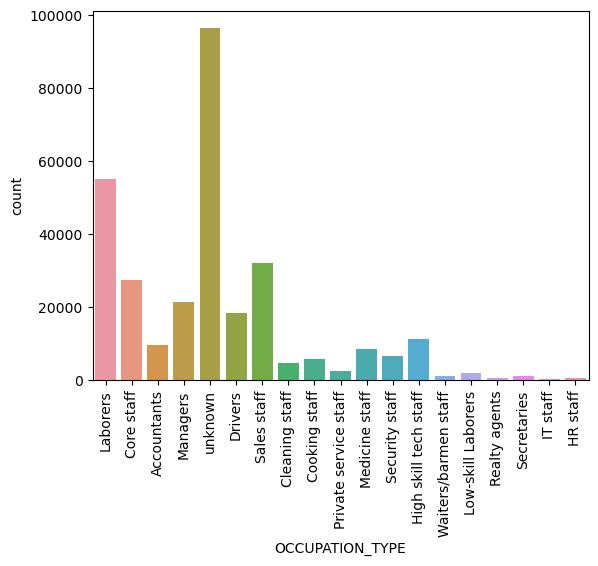

In [27]:
#let us plot the countplot for the same
sns.countplot(x=df["OCCUPATION_TYPE"])
plt.xticks(rotation=90)
plt.show()

In [28]:
##let us analyze "EXT_SOURCE_3" column:

In [29]:
df["EXT_SOURCE_3"].value_counts()

0.746300    1460
0.713631    1315
0.694093    1276
0.670652    1191
0.652897    1154
            ... 
0.021492       1
0.019468       1
0.023062       1
0.014556       1
0.043227       1
Name: EXT_SOURCE_3, Length: 814, dtype: int64

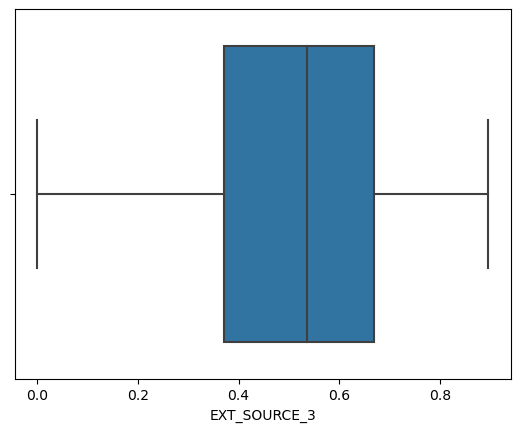

In [30]:
sns.boxplot(df["EXT_SOURCE_3"])
plt.show()

In [31]:
df["EXT_SOURCE_3"].describe()

count    246546.000000
mean          0.510853
std           0.194844
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.896010
Name: EXT_SOURCE_3, dtype: float64

In [32]:
df["EXT_SOURCE_3"].mode()[0]

0.746300213050371

In [33]:
##Lets look at the statistic of the six columns
df[["AMT_REQ_CREDIT_BUREAU_YEAR",
"AMT_REQ_CREDIT_BUREAU_QRT",
"AMT_REQ_CREDIT_BUREAU_MON",
"AMT_REQ_CREDIT_BUREAU_WEEK",
"AMT_REQ_CREDIT_BUREAU_DAY",
"AMT_REQ_CREDIT_BUREAU_HOUR"]].describe()

,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR
count,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,1.899974,0.265474,0.267395,0.034362,0.007000,0.006402
std,1.869295,0.794056,0.916002,0.204685,0.110757,0.083849
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,25.000000,261.000000,27.000000,8.000000,9.000000,4.000000


In [34]:
##Most recurring values in the above columns
df[["AMT_REQ_CREDIT_BUREAU_YEAR",
"AMT_REQ_CREDIT_BUREAU_QRT",
"AMT_REQ_CREDIT_BUREAU_MON",
"AMT_REQ_CREDIT_BUREAU_WEEK",
"AMT_REQ_CREDIT_BUREAU_DAY",
"AMT_REQ_CREDIT_BUREAU_HOUR"]].mode()

,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR
0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
##Let us analyze the columns that have less then 1% and more then 0% null values
null_df_under1=null_df[(null_df["null_count_percentage"]>0)&(null_df["null_count_percentage"]<1)]

In [36]:
null_df_under1

,column_name,null_count,null_count_percentage
10,AMT_GOODS_PRICE,278,0.09
11,NAME_TYPE_SUITE,1292,0.42
42,EXT_SOURCE_2,660,0.21
91,OBS_30_CNT_SOCIAL_CIRCLE,1021,0.33
92,DEF_30_CNT_SOCIAL_CIRCLE,1021,0.33
93,OBS_60_CNT_SOCIAL_CIRCLE,1021,0.33
94,DEF_60_CNT_SOCIAL_CIRCLE,1021,0.33


In [37]:
#let analyze AMT_GOODS_PRICE

In [38]:
df["AMT_GOODS_PRICE"].value_counts()

450000.0     26022
225000.0     25282
675000.0     24962
900000.0     15416
270000.0     11428
             ...  
1265751.0        1
503266.5         1
810778.5         1
666090.0         1
743863.5         1
Name: AMT_GOODS_PRICE, Length: 1002, dtype: int64

In [39]:
df["AMT_GOODS_PRICE"].describe()

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

<function matplotlib.pyplot.box(on=None)>

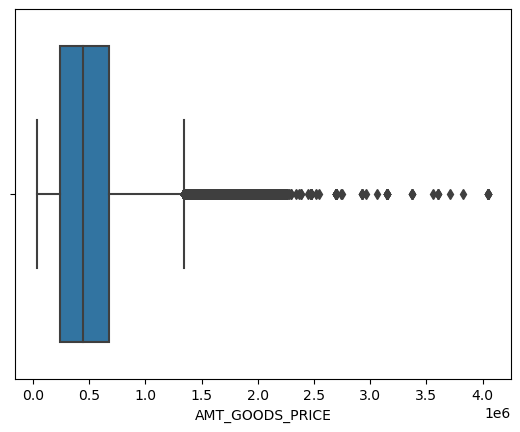

In [40]:
sns.boxplot(df["AMT_GOODS_PRICE"])
plt.box

In [41]:
#Most recurring values
df["AMT_GOODS_PRICE"].mode()[0]

450000.0

In [42]:
##Average value of "AMT_GOODS_PRICE"
df["AMT_GOODS_PRICE"].mean()

538396.2074288895

In [43]:
##Let us analyse"NAME_TYPE_SUITE" column


df["NAME_TYPE_SUITE"].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [44]:
df["NAME_TYPE_SUITE"].describe()

count            306219
unique                7
top       Unaccompanied
freq             248526
Name: NAME_TYPE_SUITE, dtype: object

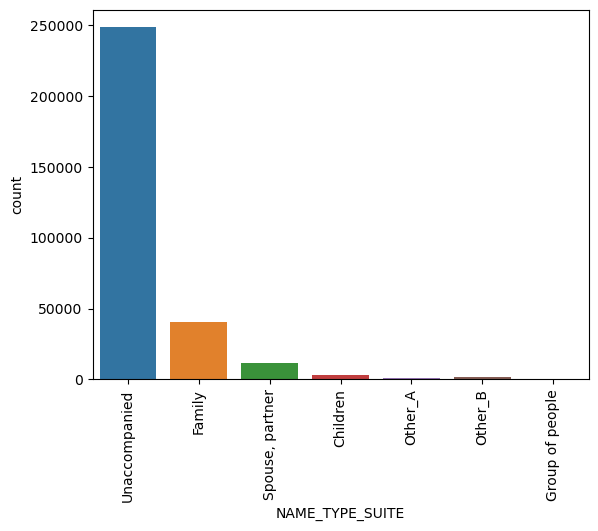

In [45]:
sns.countplot(data=df, x=df["NAME_TYPE_SUITE"])
plt.xticks(rotation=90)
plt.show()


In [46]:
##let us analyze "EXT_SOURCE_2" column
df["EXT_SOURCE_2"].value_counts()

0.285898    721
0.262258    417
0.265256    343
0.159679    322
0.265312    306
           ... 
0.004725      1
0.257313      1
0.282030      1
0.181540      1
0.267834      1
Name: EXT_SOURCE_2, Length: 119831, dtype: int64

In [47]:
df["EXT_SOURCE_2"].describe()

count    3.068510e+05
mean     5.143927e-01
std      1.910602e-01
min      8.173617e-08
25%      3.924574e-01
50%      5.659614e-01
75%      6.636171e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64

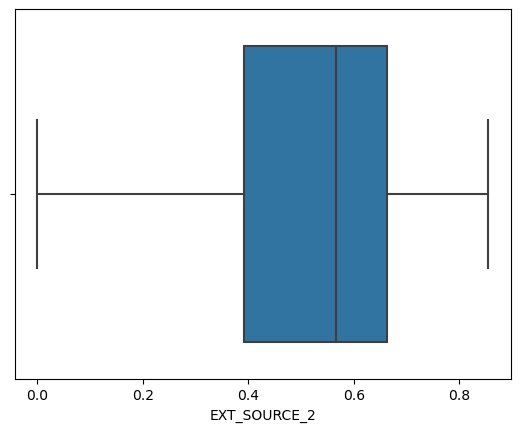

In [48]:
sns.boxplot(df["EXT_SOURCE_2"])
plt.show()

In [49]:
##Let us analyze the columns that have same null percentage

In [50]:
df["OBS_30_CNT_SOCIAL_CIRCLE"].describe()

count    306490.000000
mean          1.422245
std           2.400989
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         348.000000
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [51]:
df["OBS_30_CNT_SOCIAL_CIRCLE"].mean()

1.4222454239942575

In [52]:
df["OBS_30_CNT_SOCIAL_CIRCLE"].mode()[0]

0.0

In [53]:
df["OBS_30_CNT_SOCIAL_CIRCLE"].value_counts()

0.0      163910
1.0       48783
2.0       29808
3.0       20322
4.0       14143
5.0        9553
6.0        6453
7.0        4390
8.0        2967
9.0        2003
10.0       1376
11.0        852
12.0        652
13.0        411
14.0        258
15.0        166
16.0        133
17.0         88
18.0         46
19.0         44
20.0         30
21.0         29
22.0         22
23.0         15
25.0         11
24.0         11
27.0          5
26.0          3
30.0          2
28.0          1
29.0          1
47.0          1
348.0         1
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

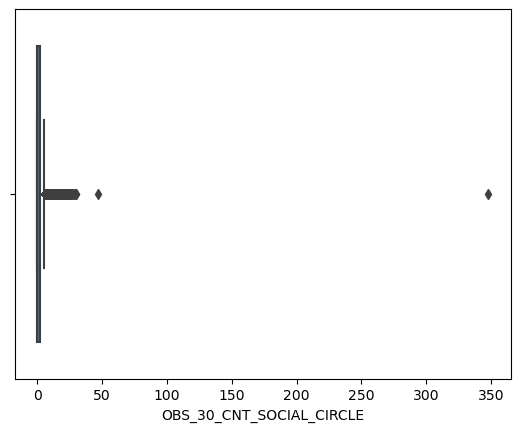

In [54]:
sns.boxplot(df.OBS_30_CNT_SOCIAL_CIRCLE)
plt.show()

In [55]:
##Analysis of DEF_30_CNT_SOCIAL_CIRCLE column
df["DEF_30_CNT_SOCIAL_CIRCLE"].value_counts()

0.0     271324
1.0      28328
2.0       5323
3.0       1192
4.0        253
5.0         56
6.0         11
7.0          1
34.0         1
8.0          1
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [56]:
df["DEF_30_CNT_SOCIAL_CIRCLE"].describe()

count    306490.000000
mean          0.143421
std           0.446698
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          34.000000
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: float64

In [57]:
df["DEF_30_CNT_SOCIAL_CIRCLE"].mean()

0.1434206662533851

In [58]:
df["DEF_30_CNT_SOCIAL_CIRCLE"].mode()[0]

0.0

In [59]:
df["DEF_30_CNT_SOCIAL_CIRCLE"].median()

0.0

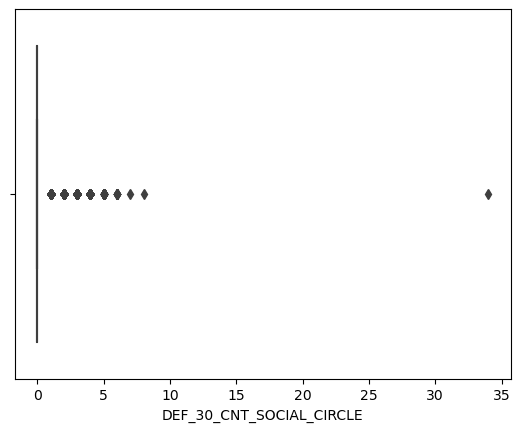

In [60]:
#lets check for outliers
sns.boxplot(df["DEF_30_CNT_SOCIAL_CIRCLE"])
plt.show()

In [61]:
##Analyse of "OBS_60_CNT_SOCIAL_CIRCLE" column
df["OBS_60_CNT_SOCIAL_CIRCLE"].value_counts()

0.0      164666
1.0       48870
2.0       29766
3.0       20215
4.0       13946
5.0        9463
6.0        6349
7.0        4344
8.0        2886
9.0        1959
10.0       1335
11.0        837
12.0        620
13.0        401
14.0        238
15.0        166
16.0        137
17.0         73
18.0         49
19.0         44
20.0         30
21.0         28
22.0         20
23.0         13
24.0         12
25.0         11
27.0          5
29.0          2
28.0          1
47.0          1
344.0         1
30.0          1
26.0          1
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [62]:
df["OBS_60_CNT_SOCIAL_CIRCLE"].describe()

count    306490.000000
mean          1.405292
std           2.379803
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         344.000000
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64

In [63]:
df["OBS_60_CNT_SOCIAL_CIRCLE"].mode()[0]

0.0

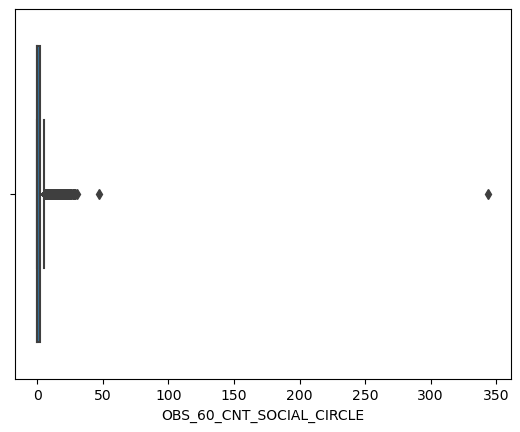

In [64]:
sns.boxplot(df["OBS_60_CNT_SOCIAL_CIRCLE"])
plt.show()

In [65]:
##Analyse of "DEF_60_CNT_SOCIAL_CIRCLE" column
df["DEF_60_CNT_SOCIAL_CIRCLE"].value_counts()

0.0     280721
1.0      21841
2.0       3170
3.0        598
4.0        135
5.0         20
6.0          3
7.0          1
24.0         1
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [66]:
df["DEF_60_CNT_SOCIAL_CIRCLE"].describe()

count    306490.000000
mean          0.100049
std           0.362291
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          24.000000
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64

In [67]:
df["DEF_60_CNT_SOCIAL_CIRCLE"].mode()[0]

0.0

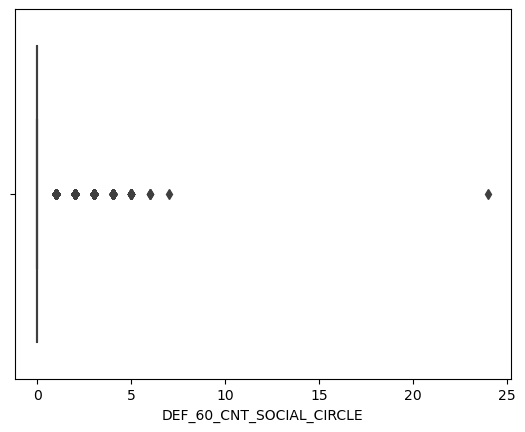

In [68]:
sns.boxplot(df["DEF_60_CNT_SOCIAL_CIRCLE"])
plt.show()

---we are done with analysing the column on their statiscal terms,now let us deal with incorrect or unknown data

In [69]:
df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

In [70]:
#Analysis of "CODE_GENDER" column

In [71]:
df['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

Gender should only be Male or Female. XNA value may indicate that the value was not provided by the loan applicant or missed by the loan officer verifying the application

In [72]:
df[df["CODE_GENDER"]=="XNA"]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
35657,141289,0,Revolving loans,XNA,Y,Y,0,207000.0,382500.0,19125.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
38566,144669,0,Revolving loans,XNA,N,Y,2,157500.0,270000.0,13500.0,...,0,0,0,0,0.0,0.0,0.0,3.0,0.0,4.0
83382,196708,0,Revolving loans,XNA,N,Y,1,135000.0,405000.0,20250.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
189640,319880,0,Revolving loans,XNA,Y,Y,0,247500.0,540000.0,27000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,6.0


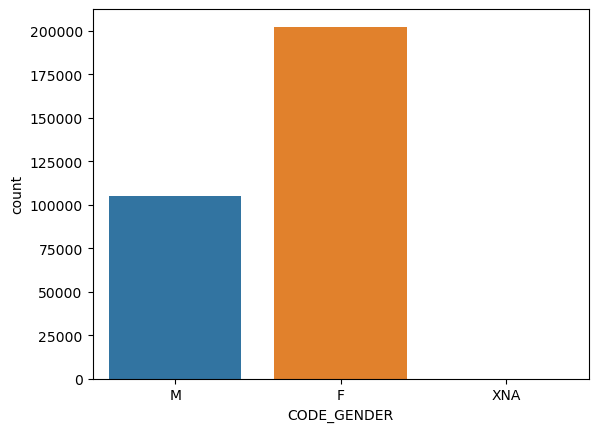

In [73]:
sns.countplot(data=df,x=df["CODE_GENDER"])
plt.show()

In [74]:
##Here females are almost double in number to males so we impute the XNA value with Females
df['CODE_GENDER']=df["CODE_GENDER"].apply(lambda x: 'F' if x == 'XNA' else x)

In [75]:
df["CODE_GENDER"].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

In [76]:
#Analysis of DAYS_BIRTH column

df["DAYS_BIRTH"].value_counts()

-13749    43
-13481    42
-18248    41
-10020    41
-15771    40
          ..
-24898     1
-24868     1
-8017      1
-25098     1
-25061     1
Name: DAYS_BIRTH, Length: 17460, dtype: int64

In [77]:
##Converting negative days birth to positive days birth
df["DAYS_BIRTH"]=df["DAYS_BIRTH"].apply(lambda x:-x if x<0 else x)


In [78]:
df["DAYS_BIRTH"].value_counts()

13749    43
13481    42
18248    41
10020    41
15771    40
         ..
24898     1
24868     1
8017      1
25098     1
25061     1
Name: DAYS_BIRTH, Length: 17460, dtype: int64

In [79]:
##Creating a new column YEARS_BIRTH for ease of analysis

In [80]:
df['YEARS_BIRTH'] = df['DAYS_BIRTH'].apply(lambda x: round(x/365))

In [81]:
##def a functions YEARS_BIRTH_RANGE for "YEARS_BIRTH_CATEGORY"

def YEARS_BIRTH_RANGE(years):
    if years<=20:
        return "0-20"
    elif  years> 20 and years <= 30:
        return '20-30'
    elif years > 30 and years <= 40:
        return '30-40'  
    elif years > 40 and years <= 50:
        return '40-50'
    elif years> 50 and years <= 60:
        return '50-60'
    elif years > 60 and years <= 70:
        return '60-70'
    elif years > 70:
        return '70+'

In [82]:
#new column added
df['YEARS_BIRTH_CATEGORY'] = df['YEARS_BIRTH'].apply(YEARS_BIRTH_RANGE)

In [83]:
df['YEARS_BIRTH_CATEGORY']

0         20-30
1         40-50
2         50-60
3         50-60
4         50-60
          ...  
307506    20-30
307507    50-60
307508    40-50
307509    30-40
307510    40-50
Name: YEARS_BIRTH_CATEGORY, Length: 307511, dtype: object

In [84]:
# Analysis of "NAME_FAMILY_STATUS" column

In [85]:
df["NAME_FAMILY_STATUS"].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

In [86]:
df['NAME_FAMILY_STATUS']=df["NAME_FAMILY_STATUS"].apply(lambda x:"Married" if x=="Unknown" else x)

In [87]:
df["NAME_FAMILY_STATUS"].value_counts()

Married                 196434
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Name: NAME_FAMILY_STATUS, dtype: int64

In [88]:
##Analysis of "DAYS_EMPLOYED" column

In [89]:
df["DAYS_EMPLOYED"].value_counts()

 365243    55374
-200         156
-224         152
-230         151
-199         151
           ...  
-13961         1
-11827         1
-10176         1
-9459          1
-8694          1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

In [90]:
df['DAYS_EMPLOYED']=df["DAYS_EMPLOYED"].apply(lambda x:-x if x<0 else x)

In [91]:
df["DAYS_EMPLOYED"].value_counts()

365243    55374
200         156
224         152
230         151
199         151
          ...  
13961         1
11827         1
10176         1
9459          1
8694          1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

In [92]:
##Creating a new column YEARS_EMPLOYED for ease of analysis
df['YEARS_EMPLOYED'] = df['DAYS_EMPLOYED'].apply(lambda x: round(x/365))

In [93]:
##Analysis of "DAYS_REGISTRATION" column

In [94]:
df["DAYS_REGISTRATION"].value_counts()

-1.0        113
-7.0         98
-6.0         96
-4.0         92
-2.0         92
           ... 
-15581.0      1
-15031.0      1
-14804.0      1
-15008.0      1
-14798.0      1
Name: DAYS_REGISTRATION, Length: 15688, dtype: int64

In [95]:
df["DAYS_REGISTRATION"]=df["DAYS_REGISTRATION"].apply(lambda x:-x if x<0 else x)

In [96]:
df["DAYS_REGISTRATION"].value_counts()

1.0        113
7.0         98
6.0         96
4.0         92
2.0         92
          ... 
15581.0      1
15031.0      1
14804.0      1
15008.0      1
14798.0      1
Name: DAYS_REGISTRATION, Length: 15688, dtype: int64

In [97]:
##Creating a new column YEARS_REGISTRATION for ease of analysis
df['YEARS_REGISTRATION'] = df['DAYS_REGISTRATION'].apply(lambda x: round(x/365))

In [98]:
##Analysis of "DAYS_ID_PUBLISH" column

In [99]:
df["DAYS_ID_PUBLISH"].value_counts()

-4053    169
-4095    162
-4046    161
-4417    159
-4256    158
        ... 
-5896      1
-5921      1
-5753      1
-5960      1
-6211      1
Name: DAYS_ID_PUBLISH, Length: 6168, dtype: int64

In [100]:
df["DAYS_ID_PUBLISH"]=df["DAYS_ID_PUBLISH"].apply(lambda x:-x if x<0 else x)

In [101]:
df["DAYS_ID_PUBLISH"].value_counts()

4053    169
4095    162
4046    161
4417    159
4256    158
       ... 
5896      1
5921      1
5753      1
5960      1
6211      1
Name: DAYS_ID_PUBLISH, Length: 6168, dtype: int64

In [102]:
##Creating a new column YEARS_PUBLISH for ease of analysis
df['YEARS_PUBLISH'] = df['DAYS_ID_PUBLISH'].apply(lambda x: round(x/365))

In [103]:
##Analysis of "DAYS_LAST_PHONE_CHANGE" column

In [104]:
df["DAYS_LAST_PHONE_CHANGE"].value_counts()

 0.0       37672
-1.0        2812
-2.0        2318
-3.0        1763
-4.0        1285
           ...  
-4051.0        1
-3593.0        1
-3622.0        1
-3570.0        1
-3538.0        1
Name: DAYS_LAST_PHONE_CHANGE, Length: 3773, dtype: int64

In [105]:
df["DAYS_LAST_PHONE_CHANGE"]=df["DAYS_LAST_PHONE_CHANGE"].apply(lambda x:-x if x<0 else x)

In [106]:
df["DAYS_LAST_PHONE_CHANGE"].value_counts()

0.0       37672
1.0        2812
2.0        2318
3.0        1763
4.0        1285
          ...  
4051.0        1
3593.0        1
3622.0        1
3570.0        1
3538.0        1
Name: DAYS_LAST_PHONE_CHANGE, Length: 3773, dtype: int64

In [107]:
##Creating a new column YEARS_LAST_PHONE_CHANGE for ease of analysis
df['YEARS_LAST_PHONE_CHANGE'] = df['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: round(x/365,0))

In [108]:
df["TARGET"].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [109]:
df.TARGET.value_counts(normalize=True)*100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

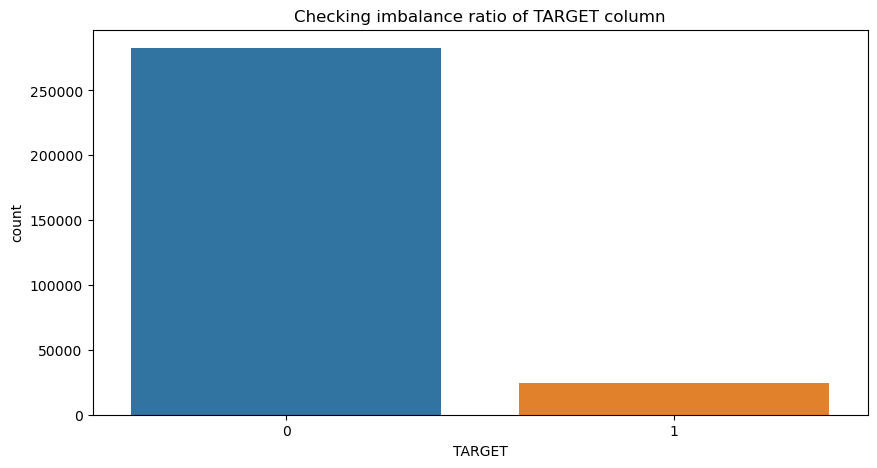

In [110]:
plt.figure(figsize = (10,5))
sns.countplot(x = df['TARGET'], data = df)
plt.title('Checking imbalance ratio of TARGET column')
plt.show()

In [111]:
df1=df[df["TARGET"]==1]

In [112]:
df1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_BIRTH_CATEGORY,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_PUBLISH,YEARS_LAST_PHONE_CHANGE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,0.0,0.0,1.0,26,20-30,2,10,6,3.0
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,...,0.0,0.0,2.0,2.0,51,50-60,7,18,5,0.0
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,...,0.0,2.0,0.0,4.0,48,40-50,3,3,3,3.0
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,...,0.0,0.0,0.0,2.0,37,30-40,10,0,12,4.0
81,100096,1,Cash loans,F,N,Y,0,81000.0,252000.0,14593.5,...,0.0,0.0,0.0,0.0,68,60-70,1001,15,12,0.0


In [113]:
df0=df[df["TARGET"]==0]

In [114]:
df0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_BIRTH_CATEGORY,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_PUBLISH,YEARS_LAST_PHONE_CHANGE
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,0.0,0.0,0.0,46,40-50,3,3,1,2.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,0.0,52,50-60,1,12,7,2.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,NaN,NaN,NaN,NaN,52,50-60,8,27,7,2.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,0.0,55,50-60,8,12,9,3.0
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,0.0,0.0,1.0,1.0,46,40-50,4,14,1,7.0


# Univariate analysis of categorical variables

In [115]:
##Analysing "NAME_CONTRACT_TYPE" column with payment difficulties

In [116]:
df1["NAME_CONTRACT_TYPE"].value_counts()

Cash loans         23221
Revolving loans     1604
Name: NAME_CONTRACT_TYPE, dtype: int64

In [117]:
df1["NAME_CONTRACT_TYPE"].value_counts(normalize=True)*100

Cash loans         93.538771
Revolving loans     6.461229
Name: NAME_CONTRACT_TYPE, dtype: float64

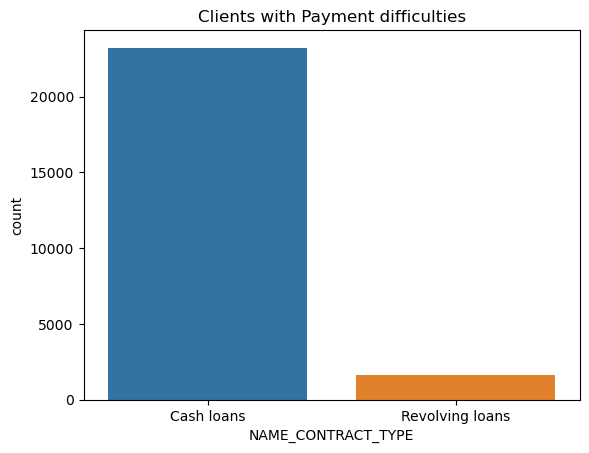

In [118]:
sns.countplot(df1["NAME_CONTRACT_TYPE"])
plt.title("Clients with Payment difficulties")
plt.show()


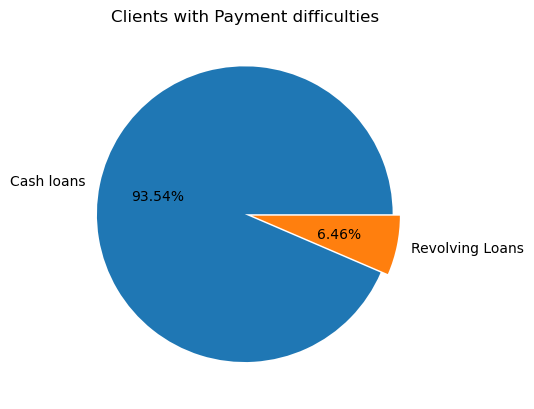

In [119]:
labels="Cash loans","Revolving Loans"
explode=(0,0.05)
sizes=[ 93.538771,6.461229]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode)
plt.title("Clients with Payment difficulties")
plt.show()

In [120]:
##Analysing "NAME_CONTRACT_TYPE" column with non payment difficulties

In [121]:
df0["NAME_CONTRACT_TYPE"].value_counts()

Cash loans         255011
Revolving loans     27675
Name: NAME_CONTRACT_TYPE, dtype: int64

In [122]:
df0["NAME_CONTRACT_TYPE"].value_counts(normalize=True)*100

Cash loans         90.209986
Revolving loans     9.790014
Name: NAME_CONTRACT_TYPE, dtype: float64

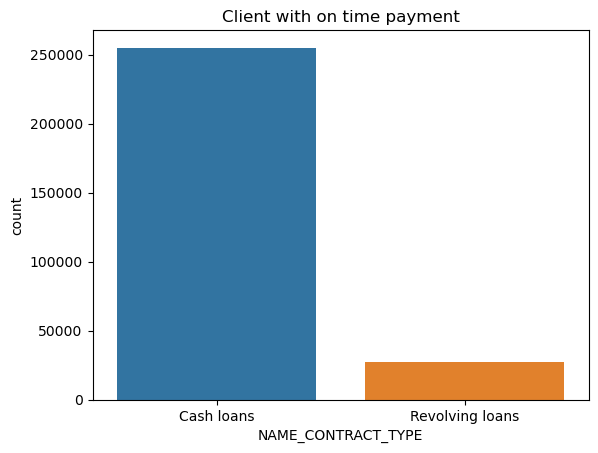

In [123]:
sns.countplot(df0["NAME_CONTRACT_TYPE"])
plt.title("Client with on time payment")
plt.show()

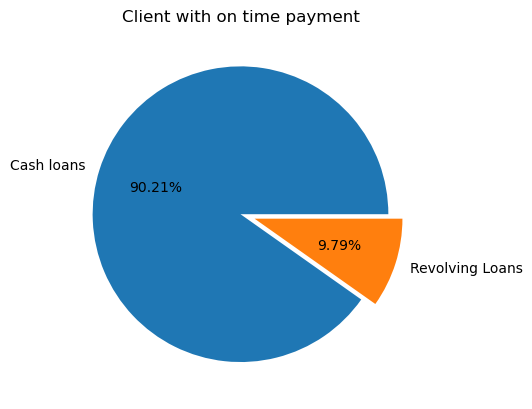

In [124]:
labels="Cash loans","Revolving Loans"
explode=(0,0.10)
sizes=[ 90.209986,9.790014]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode)
plt.title("Client with on time payment")
plt.show()

In [125]:
##Analysis of FLAG_OWN_CAR with payment difficulties

In [126]:
df1["FLAG_OWN_CAR"].value_counts()

N    17249
Y     7576
Name: FLAG_OWN_CAR, dtype: int64

In [127]:
df1["FLAG_OWN_CAR"].value_counts(normalize=True)*100

N    69.482377
Y    30.517623
Name: FLAG_OWN_CAR, dtype: float64

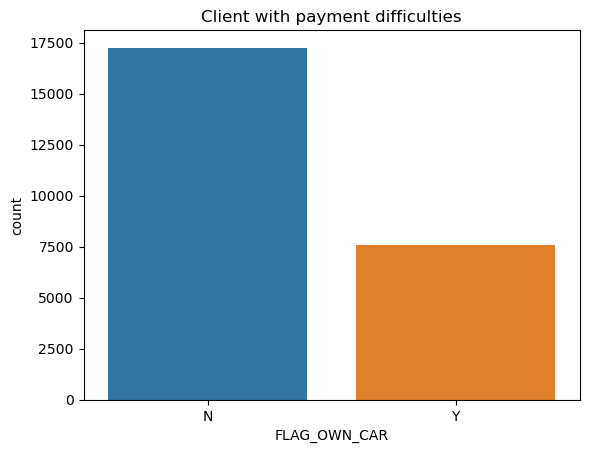

In [128]:
sns.countplot(df1["FLAG_OWN_CAR"])
plt.title("Client with payment difficulties")
plt.show()

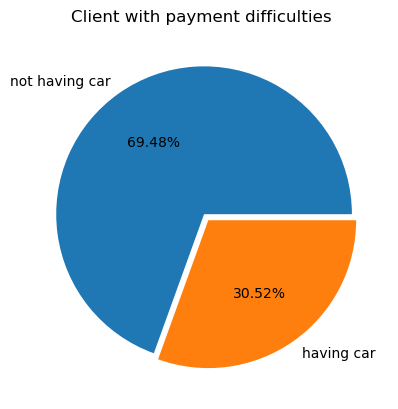

In [129]:
labels="not having car","having car"
explode=(0,0.05)
sizes=[ 69.482377,30.517623]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode)
plt.title("Client with payment difficulties ")
plt.show()

In [130]:
##Analysis of FLAG_OWN_CAR with on time payment

In [131]:
df0["FLAG_OWN_CAR"].value_counts()

N    185675
Y     97011
Name: FLAG_OWN_CAR, dtype: int64

In [132]:
df0["FLAG_OWN_CAR"].value_counts(normalize=True)*100

N    65.682418
Y    34.317582
Name: FLAG_OWN_CAR, dtype: float64

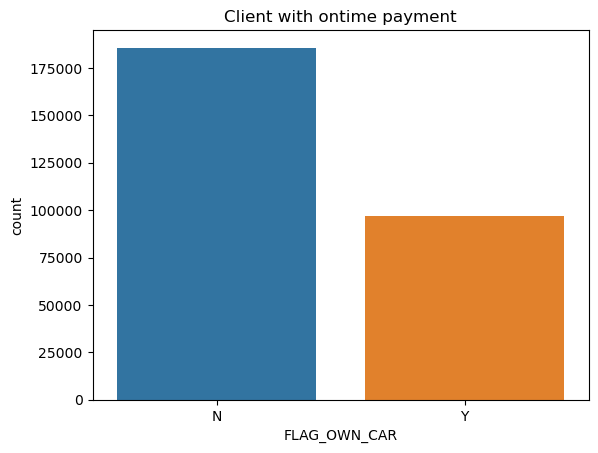

In [133]:
sns.countplot(df0["FLAG_OWN_CAR"])
plt.title("Client with ontime payment")
plt.show()

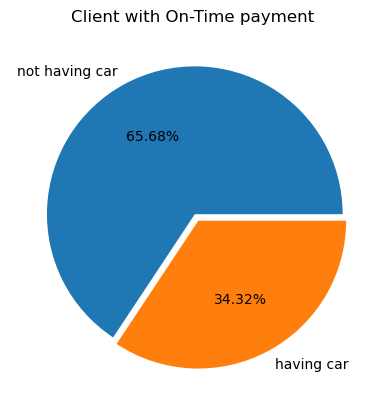

In [134]:
labels="not having car","having car"
explode=(0,0.05)
sizes=[ 65.682418,34.317582]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode)
plt.title("Client with On-Time payment ")
plt.show()

In [135]:
##Analysis of NAME_INCOME_TYPE with payment difficulties

In [136]:
df1["NAME_INCOME_TYPE"].value_counts()

Working                 15224
Commercial associate     5360
Pensioner                2982
State servant            1249
Unemployed                  8
Maternity leave             2
Name: NAME_INCOME_TYPE, dtype: int64

In [137]:
df1["NAME_INCOME_TYPE"].value_counts(normalize=True)*100

Working                 61.325277
Commercial associate    21.591138
Pensioner               12.012085
State servant            5.031219
Unemployed               0.032226
Maternity leave          0.008056
Name: NAME_INCOME_TYPE, dtype: float64

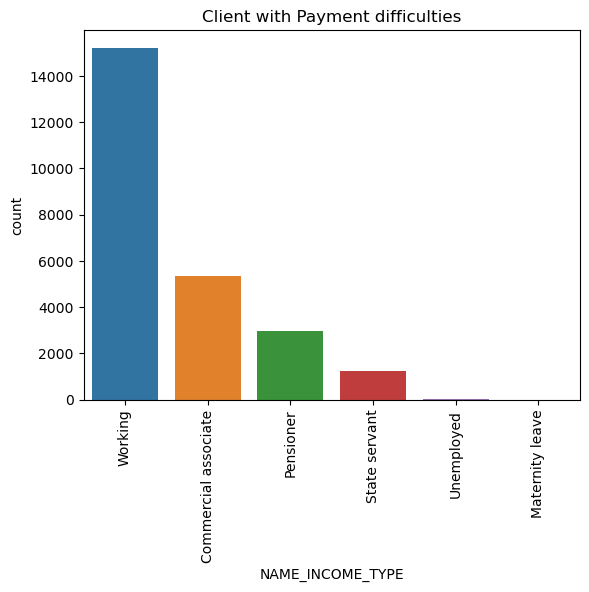

In [138]:
sns.countplot(df1["NAME_INCOME_TYPE"])
plt.title("Client with Payment difficulties")
plt.xticks(rotation=90)
plt.show()

In [139]:
##Analysis of NAME_INCOME_TYPE with on time payment

In [140]:
df0["NAME_INCOME_TYPE"].value_counts()

Working                 143550
Commercial associate     66257
Pensioner                52380
State servant            20454
Student                     18
Unemployed                  14
Businessman                 10
Maternity leave              3
Name: NAME_INCOME_TYPE, dtype: int64

In [141]:
df0["NAME_INCOME_TYPE"].value_counts(normalize=True)*100

Working                 50.780725
Commercial associate    23.438373
Pensioner               18.529393
State servant            7.235590
Student                  0.006367
Unemployed               0.004952
Businessman              0.003537
Maternity leave          0.001061
Name: NAME_INCOME_TYPE, dtype: float64

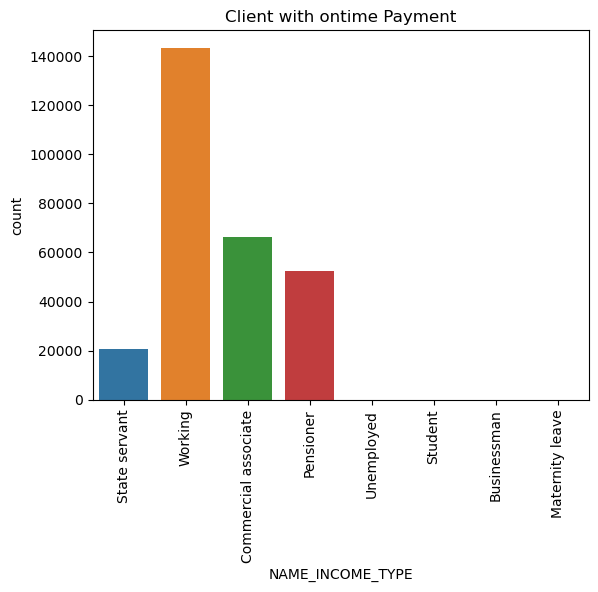

In [142]:
sns.countplot(df0["NAME_INCOME_TYPE"])
plt.title("Client with ontime Payment")
plt.xticks(rotation=90)
plt.show()

In [143]:
## Analysis of "NAME_EDUCATION_TYPE" with payment difficulties

In [144]:
df1["NAME_EDUCATION_TYPE"].value_counts()

Secondary / secondary special    19524
Higher education                  4009
Incomplete higher                  872
Lower secondary                    417
Academic degree                      3
Name: NAME_EDUCATION_TYPE, dtype: int64

In [145]:
df1["NAME_EDUCATION_TYPE"].value_counts(normalize=True)*100

Secondary / secondary special    78.646526
Higher education                 16.149043
Incomplete higher                 3.512588
Lower secondary                   1.679758
Academic degree                   0.012085
Name: NAME_EDUCATION_TYPE, dtype: float64

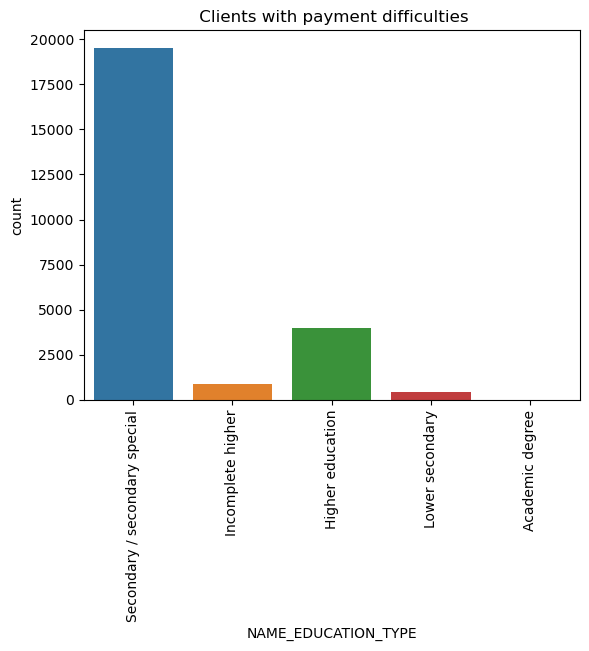

In [146]:
sns.countplot(df1["NAME_EDUCATION_TYPE"])
plt.title(" Clients with payment difficulties")
plt.xticks(rotation=90)
plt.show()

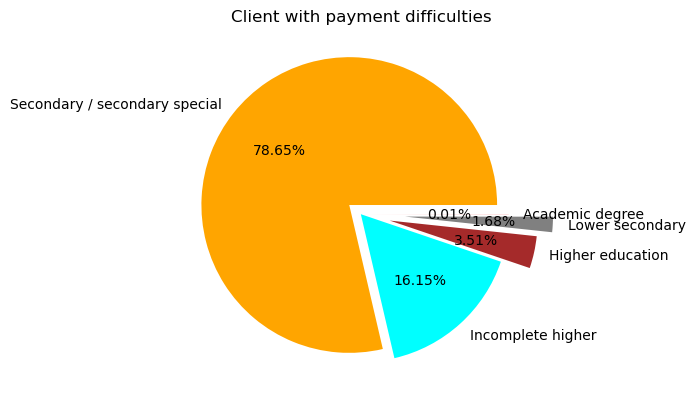

In [147]:
labels=df1["NAME_EDUCATION_TYPE"].unique()
explode =(0.1, 0.0, 0.2, 0.3, 0.0)
colors = ( "orange", "cyan", "brown",
          "grey", "red")
sizes=[ 78.646526,16.149043,3.512588,1.679758,0.012085]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode,colors=colors)
 
plt.title("Client with payment difficulties")
plt.show()

In [148]:
## Analysis of "NAME_EDUCATION_TYPE" with on time payment 

In [149]:
df0["NAME_EDUCATION_TYPE"].value_counts()

Secondary / secondary special    198867
Higher education                  70854
Incomplete higher                  9405
Lower secondary                    3399
Academic degree                     161
Name: NAME_EDUCATION_TYPE, dtype: int64

In [150]:
df0["NAME_EDUCATION_TYPE"].value_counts(normalize=True)*100

Secondary / secondary special    70.349080
Higher education                 25.064559
Incomplete higher                 3.327013
Lower secondary                   1.202394
Academic degree                   0.056954
Name: NAME_EDUCATION_TYPE, dtype: float64

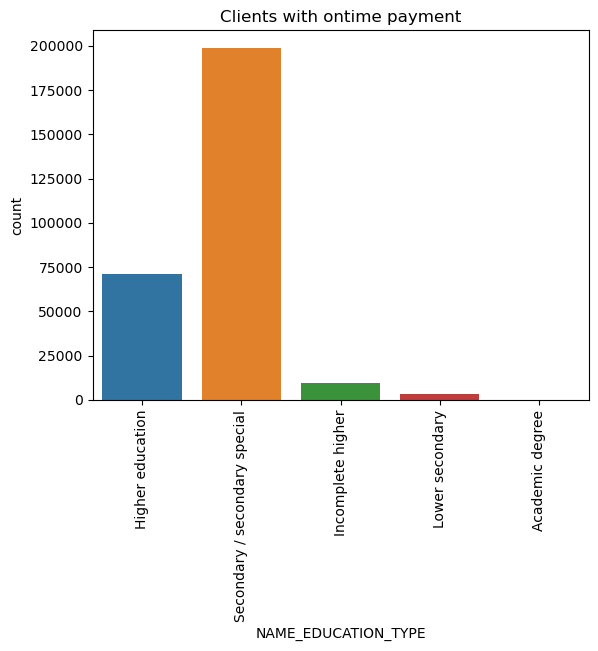

In [151]:
sns.countplot(df0["NAME_EDUCATION_TYPE"])
plt.title("Clients with ontime payment")
plt.xticks(rotation=90)
plt.show()

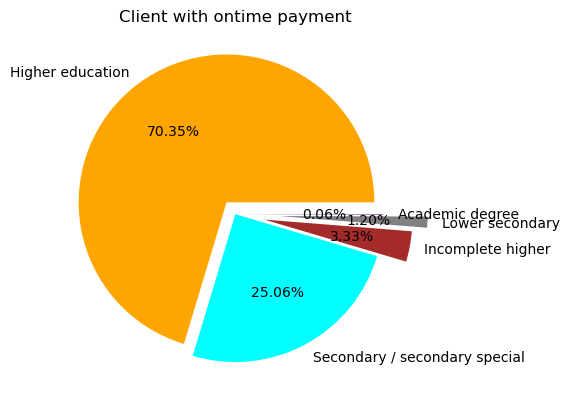

In [152]:
labels=df0["NAME_EDUCATION_TYPE"].unique()
explode =(0.1, 0.0, 0.2, 0.3, 0.0)
colors = ( "orange", "cyan", "brown",
          "grey", "indigo")
sizes=[70.349080,25.064559,3.327013,1.202394,0.056954]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode,colors=colors)
 
plt.title("Client with ontime payment")
plt.show()

In [153]:
## Analysis of CODE_GENDER with payment difficulties
df1["CODE_GENDER"].value_counts()

F    14170
M    10655
Name: CODE_GENDER, dtype: int64

In [154]:
df1["CODE_GENDER"].value_counts(normalize=True)*100

F    57.079557
M    42.920443
Name: CODE_GENDER, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

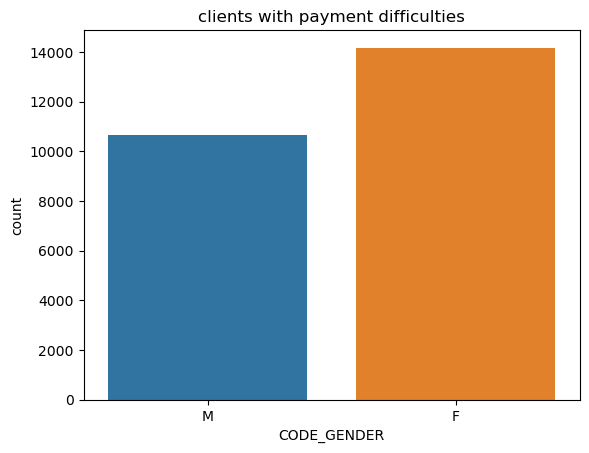

In [155]:
sns.countplot(df1["CODE_GENDER"])
plt.title("clients with payment difficulties")
plt.show

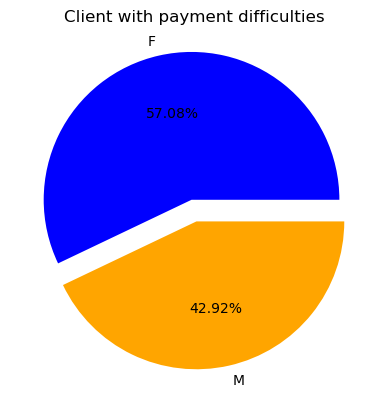

In [156]:
labels="F","M"
explode =(0.1, 0.05)
colors = ( "blue",'orange')
sizes=[57.079557,42.920443]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode,colors=colors)
 
plt.title("Client with payment difficulties")
plt.show()

In [157]:
##Analysis of "CODE_GENDER" with ontime payments
df0["CODE_GENDER"].value_counts()


F    188282
M     94404
Name: CODE_GENDER, dtype: int64

In [158]:
df0["CODE_GENDER"].value_counts(normalize=True)*100

F    66.604643
M    33.395357
Name: CODE_GENDER, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

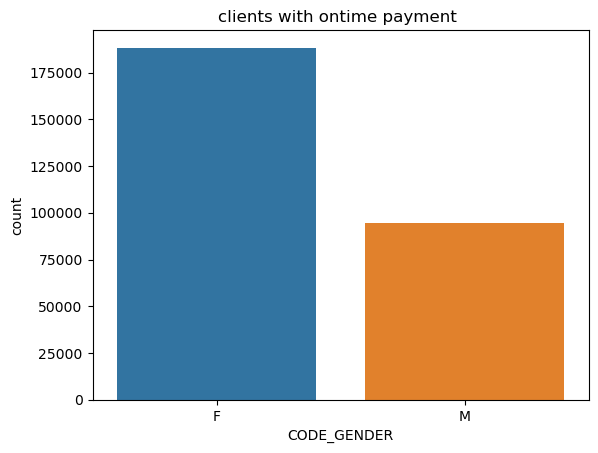

In [159]:
sns.countplot(df0["CODE_GENDER"])
plt.title("clients with ontime payment ")
plt.show

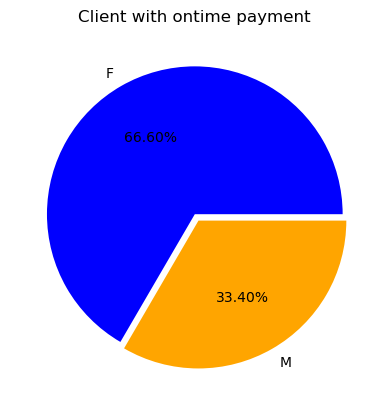

In [160]:
labels="F","M"
explode =(0.0, 0.05)
colors = ( "blue",'orange')
sizes=[66.604643,33.395357]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode,colors=colors)
 
plt.title("Client with ontime payment")
plt.show()

In [161]:
## Analysis of NAME_FAMILY_STATUS with payment difficulties
df1["NAME_FAMILY_STATUS"].value_counts()

Married                 14850
Single / not married     4457
Civil marriage           2961
Separated                1620
Widow                     937
Name: NAME_FAMILY_STATUS, dtype: int64

In [162]:
df1["NAME_FAMILY_STATUS"].value_counts(normalize=True)*100

Married                 59.818731
Single / not married    17.953676
Civil marriage          11.927492
Separated                6.525680
Widow                    3.774421
Name: NAME_FAMILY_STATUS, dtype: float64

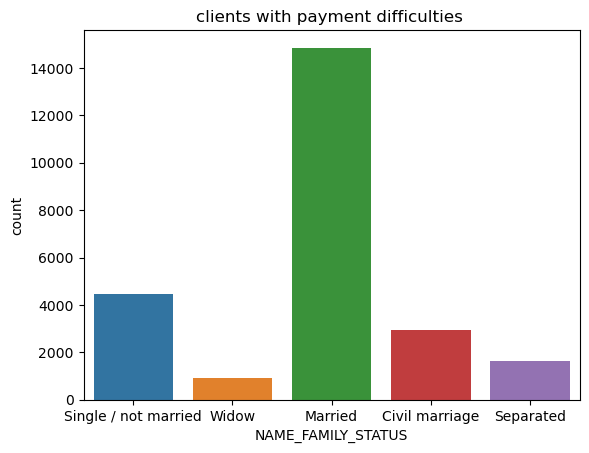

In [163]:
sns.countplot(df1["NAME_FAMILY_STATUS"])
plt.title("clients with payment difficulties ")
plt.show()

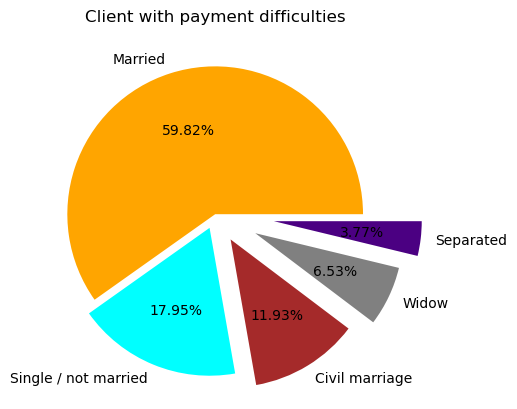

In [164]:
labels=df0["NAME_FAMILY_STATUS"].unique()
explode =(0.0, 0.1, 0.2, 0.3, 0.4)
colors = ( "orange", "cyan", "brown",
          "grey", "indigo")
sizes=[59.818731, 17.953676,11.927492,6.525680,3.774421]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode,colors=colors)
 
plt.title("Client with payment difficulties")
plt.show()

In [165]:
## Analysis of NAME_FAMILY_STATUS with ontime payment

In [166]:
df0["NAME_FAMILY_STATUS"].value_counts()

Married                 181584
Single / not married     40987
Civil marriage           26814
Separated                18150
Widow                    15151
Name: NAME_FAMILY_STATUS, dtype: int64

In [167]:
df0["NAME_FAMILY_STATUS"].value_counts(normalize=True)*100

Married                 64.235229
Single / not married    14.499126
Civil marriage           9.485436
Separated                6.420551
Widow                    5.359657
Name: NAME_FAMILY_STATUS, dtype: float64

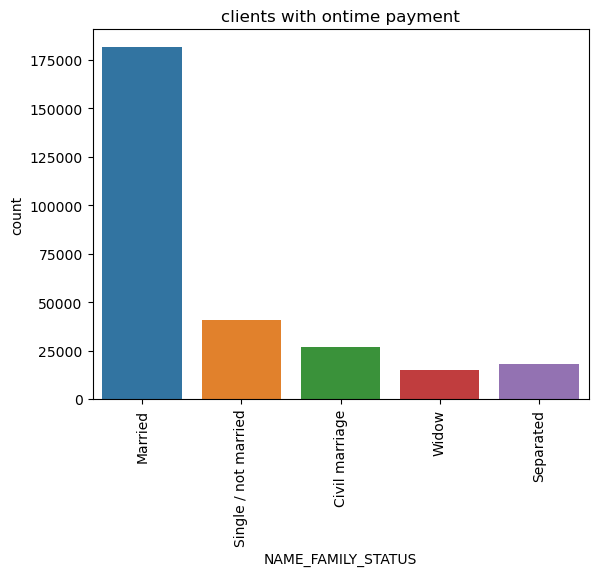

In [168]:
sns.countplot(df0["NAME_FAMILY_STATUS"])
plt.title("clients with ontime payment")
plt.xticks(rotation=90)
plt.show()

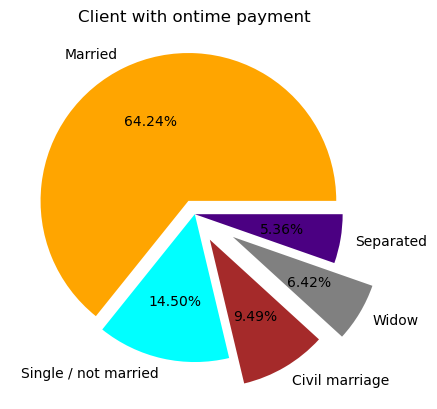

In [169]:
labels=df0["NAME_FAMILY_STATUS"].unique()
explode =(0.1, 0.0, 0.2, 0.3, 0.0)
colors = ( "orange", "cyan", "brown",
          "grey", "indigo")
sizes=[64.235229,14.499126,9.485436,6.420551,5.359657]
plt.pie(sizes,labels=labels,autopct='%.2f%%',explode=explode,colors=colors,)
 
plt.title("Client with ontime payment")
plt.show()

# Correlation analysis of numerical variables   

In [170]:
##Plotting correlation matrix with payment difficulties
df1.select_dtypes(include=["int64","float64"]).shape

(24825, 66)

In [171]:
df1.columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_

In [172]:
comat_df1=df1.select_dtypes(include=["int","float"]).corr()

In [173]:
comat_df1.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_PUBLISH,YEARS_LAST_PHONE_CHANGE
SK_ID_CURR,1.000000,NaN,-0.005144,-0.010165,-0.001290,-0.007578,-0.001816,0.006301,0.001254,-0.005161,...,-0.007954,-0.002999,0.006436,-0.000880,0.008916,0.001299,-0.005166,-0.006408,0.002450,-0.002190
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.005144,NaN,1.000000,0.004796,-0.001675,0.031257,-0.008112,-0.031975,-0.259109,-0.192864,...,-0.013004,-0.011792,-0.012583,-0.018174,-0.035427,-0.258910,-0.192862,-0.149369,0.032679,-0.012285
AMT_INCOME_TOTAL,-0.010165,NaN,0.004796,1.000000,0.038131,0.046421,0.037583,0.009135,-0.003096,-0.014977,...,-0.000272,0.000018,0.004114,-0.001133,0.001752,-0.002872,-0.014967,0.000144,0.004242,0.002357
AMT_CREDIT,-0.001290,NaN,-0.001675,0.038131,1.000000,0.752195,0.983103,0.069161,0.135316,0.001930,...,0.003008,0.007650,0.055038,-0.017467,-0.035719,0.135318,0.001933,0.025925,0.052461,0.108885


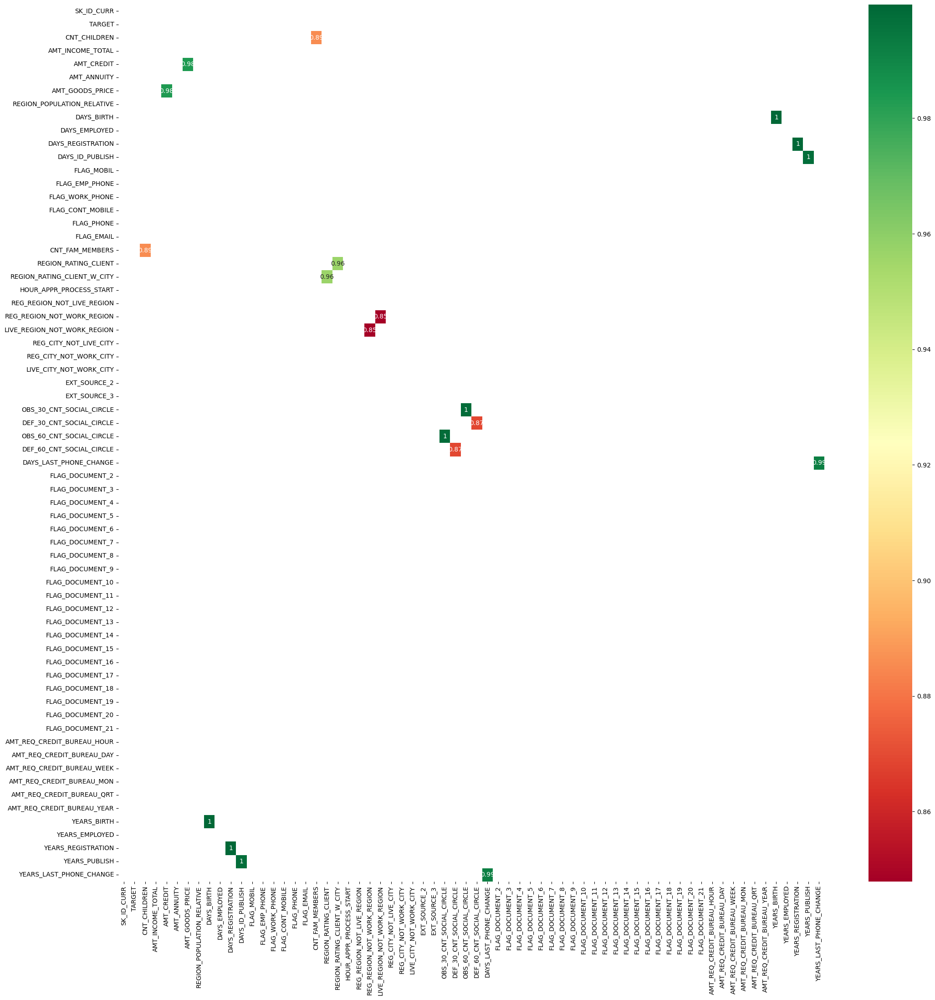

In [174]:
plt.figure(figsize=(25,25))
sns.heatmap(data=comat_df1[(comat_df1>=0.8)&(comat_df1<0.9999)],cmap="RdYlGn",cbar=True,annot=True)
plt.show()

In [175]:
comat_df1[comat_df1<0.9999].unstack().sort_values(ascending=False).head(22)

DAYS_BIRTH                   YEARS_BIRTH                    0.999680
YEARS_BIRTH                  DAYS_BIRTH                     0.999680
YEARS_REGISTRATION           DAYS_REGISTRATION              0.999500
DAYS_REGISTRATION            YEARS_REGISTRATION             0.999500
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE       0.998269
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998269
DAYS_ID_PUBLISH              YEARS_PUBLISH                  0.997654
YEARS_PUBLISH                DAYS_ID_PUBLISH                0.997654
YEARS_LAST_PHONE_CHANGE      DAYS_LAST_PHONE_CHANGE         0.992289
DAYS_LAST_PHONE_CHANGE       YEARS_LAST_PHONE_CHANGE        0.992289
AMT_CREDIT                   AMT_GOODS_PRICE                0.983103
AMT_GOODS_PRICE              AMT_CREDIT                     0.983103
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.956637
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.956637
CNT_CHILDREN                 CNT_F

In [176]:
##Plotting correlation matrix for On-Time payments
comat_df0=df0.select_dtypes(include=["int","float"]).corr()


In [177]:
comat_df0.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_PUBLISH,YEARS_LAST_PHONE_CHANGE
SK_ID_CURR,1.000000,NaN,-0.000716,0.001739,-0.000342,0.000068,-0.000205,0.000360,0.001346,0.001744,...,-0.001725,0.002524,0.000054,0.001148,0.004349,0.001324,0.001744,0.001535,0.000123,0.001052
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.000716,NaN,1.000000,0.027397,0.003081,0.020905,-0.000525,-0.024363,-0.336966,-0.245174,...,0.000648,-0.001632,-0.010455,-0.007087,-0.042547,-0.336847,-0.245174,-0.185586,0.028569,0.008606
AMT_INCOME_TOTAL,0.001739,NaN,0.027397,1.000000,0.342799,0.418953,0.349462,0.167851,-0.062609,-0.140392,...,0.007862,0.006234,0.061470,0.013128,0.029536,-0.062597,-0.140389,-0.064963,-0.022840,0.041174
AMT_CREDIT,-0.000342,NaN,0.003081,0.342799,1.000000,0.771309,0.987250,0.100604,0.047378,-0.070104,...,0.004409,-0.001883,0.054071,0.017767,-0.048866,0.047426,-0.070102,-0.013409,0.001405,0.068155


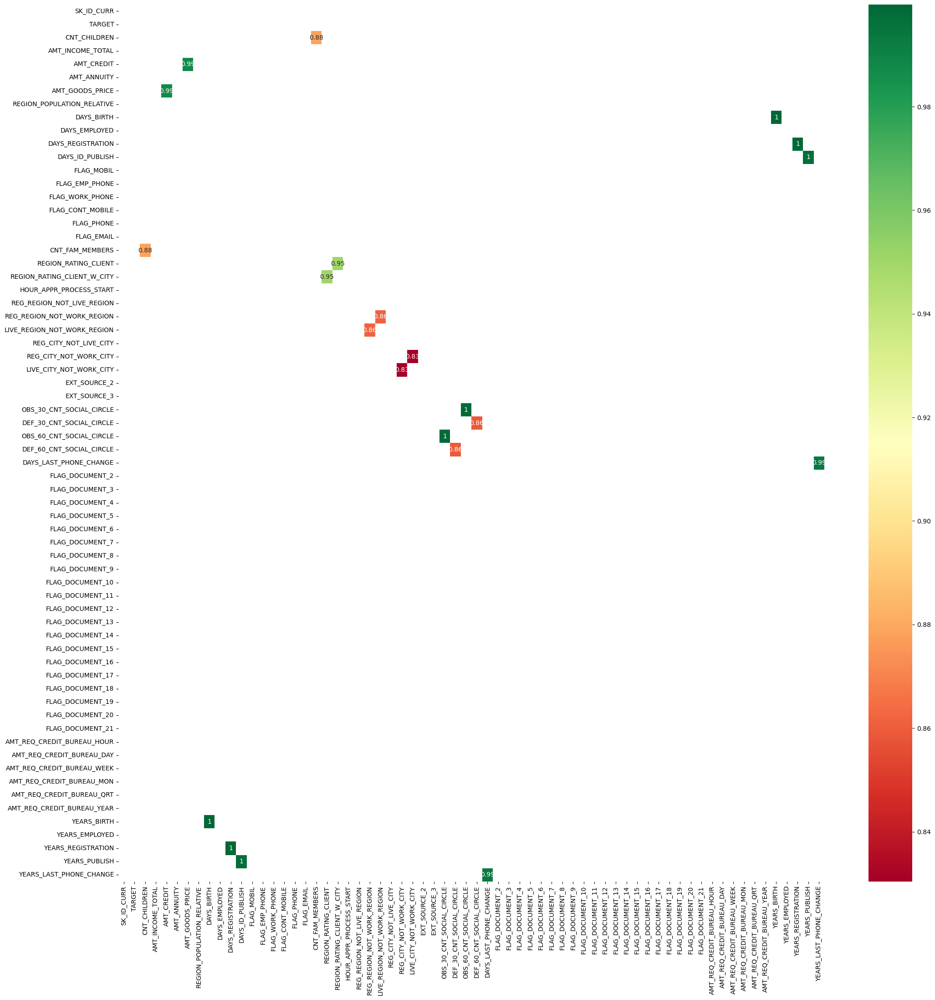

In [178]:
plt.figure(figsize=(25,25))
sns.heatmap(data=comat_df0[(comat_df0>=0.8)&(comat_df0<0.9999)],cmap="RdYlGn",cbar=True,annot=True)
plt.show()

In [179]:
comat_df0[comat_df0<0.9999].unstack().sort_values(ascending=False).head(22)

DAYS_BIRTH                   YEARS_BIRTH                    0.999706
YEARS_BIRTH                  DAYS_BIRTH                     0.999706
DAYS_REGISTRATION            YEARS_REGISTRATION             0.999560
YEARS_REGISTRATION           DAYS_REGISTRATION              0.999560
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998508
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE       0.998508
YEARS_PUBLISH                DAYS_ID_PUBLISH                0.997605
DAYS_ID_PUBLISH              YEARS_PUBLISH                  0.997605
YEARS_LAST_PHONE_CHANGE      DAYS_LAST_PHONE_CHANGE         0.993439
DAYS_LAST_PHONE_CHANGE       YEARS_LAST_PHONE_CHANGE        0.993439
AMT_GOODS_PRICE              AMT_CREDIT                     0.987250
AMT_CREDIT                   AMT_GOODS_PRICE                0.987250
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.950149
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.950149
CNT_CHILDREN                 CNT_F

# Univariate analysis of numerical variables

Analysis of "AMT_CREDIT" with Payment difficulties

In [180]:
df1["AMT_CREDIT"].value_counts()

450000.0     1058
545040.0      746
675000.0      668
225000.0      597
180000.0      592
             ... 
320040.0        1
988875.0        1
1692085.5       1
319441.5        1
1149628.5       1
Name: AMT_CREDIT, Length: 2504, dtype: int64

In [181]:
##Getting the statistical information for the column
df1["AMT_CREDIT"].describe()

count    2.482500e+04
mean     5.577785e+05
std      3.464332e+05
min      4.500000e+04
25%      2.844000e+05
50%      4.975200e+05
75%      7.333155e+05
max      4.027680e+06
Name: AMT_CREDIT, dtype: float64

In [182]:
Q1=df1["AMT_CREDIT"].quantile(0.25)
Q3=df1["AMT_CREDIT"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 448915.5


In [183]:
##Anything below Min1 and above Max1 are considered as outlier
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1 )
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: -388973.25
Max value after which outlier exist: 1406688.75


In [184]:
df0["AMT_CREDIT"].value_counts()

450000.0     8651
675000.0     8209
225000.0     7565
270000.0     6794
180000.0     6750
             ... 
553005.0        1
296671.5        1
495486.0        1
546021.0        1
1391130.0       1
Name: AMT_CREDIT, Length: 5488, dtype: int64

In [185]:
##Getting the statistical information for the column
df0["AMT_CREDIT"].describe()

count    2.826860e+05
mean     6.026483e+05
std      4.068459e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.177880e+05
75%      8.100000e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [186]:
##Lets check for the outlier in the column

In [187]:
Q1=df0["AMT_CREDIT"].quantile(0.25)
Q3=df0["AMT_CREDIT"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 540000.0


In [188]:
##Anything below Min1 and above Max1 are considered as outlier
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)


Min value before which outlier exist: -540000.0
Max value after which outlier exist: 1620000.0


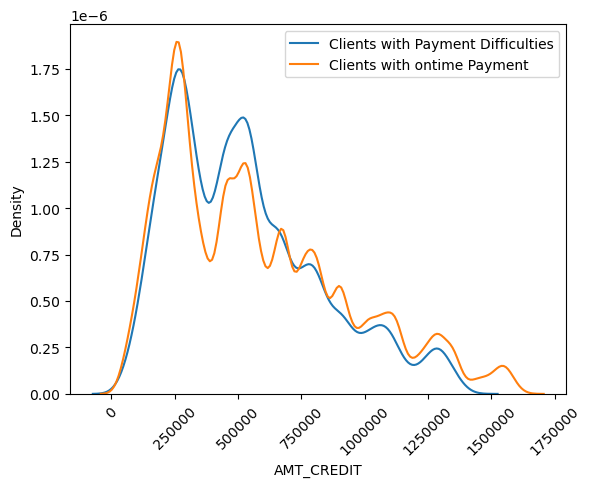

In [189]:
sns.distplot(df1[df1["AMT_CREDIT"]<=Max1].AMT_CREDIT,label="Clients with Payment Difficulties",hist=False)
sns.distplot(df0[df0["AMT_CREDIT"]<=Max0].AMT_CREDIT,label="Clients with ontime Payment ",hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

Observations

For AMT_CREDIT between 250000 and approximately 650000, there are more clients with Payment difficulties
For AMT_CREDIT > 750000 , there are more clients with On-Time Payments

In [190]:
df1["YEARS_BIRTH"].value_counts()

28    975
30    885
32    854
31    850
29    839
37    801
36    790
38    769
34    769
33    756
35    752
27    746
39    746
40    722
41    667
42    653
44    633
43    630
46    582
45    558
47    543
49    522
23    517
53    497
54    480
48    473
51    466
50    464
52    443
25    438
24    436
26    427
55    406
56    396
57    370
59    363
58    344
60    337
61    313
63    313
62    276
22    257
64    250
65    222
66     94
21     73
67     67
68     48
69     13
Name: YEARS_BIRTH, dtype: int64

In [191]:
##Getting the statistical information for the column
df1["YEARS_BIRTH"].describe()

count    24825.000000
mean        40.778973
std         11.495961
min         21.000000
25%         31.000000
50%         39.000000
75%         49.000000
max         69.000000
Name: YEARS_BIRTH, dtype: float64

In [192]:
##Lets check for the outlier in the column

In [193]:
Q1=df1["YEARS_BIRTH"].quantile(0.25)
Q3=df1["YEARS_BIRTH"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 18.0


In [194]:
##Anything below Min1 and above Max1 are considered as outlier
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: 4.0
Max value after which outlier exist: 76.0


In [195]:
df0["YEARS_BIRTH"].value_counts()

39    8277
38    8024
37    7926
40    7880
41    7828
42    7655
43    7635
44    7499
28    7492
32    7459
36    7362
31    7171
54    7009
35    6999
33    6973
30    6891
34    6890
45    6827
29    6797
46    6751
55    6734
47    6659
53    6627
57    6556
48    6434
52    6297
60    6275
49    6264
56    6261
50    6232
59    6116
58    6027
51    5951
27    5667
61    5482
63    5154
62    5086
64    4773
65    4096
26    3937
25    3641
24    3379
23    3152
66    2547
67    1767
22    1733
68    1606
21     587
69     301
Name: YEARS_BIRTH, dtype: int64

In [196]:
##Getting the statistical information for the column
df0["YEARS_BIRTH"].describe()

count    282686.000000
mean         44.216123
std          11.964511
min          21.000000
25%          34.000000
50%          43.000000
75%          54.000000
max          69.000000
Name: YEARS_BIRTH, dtype: float64

In [197]:
##Lets check for the outlier in the column

In [198]:
Q1=df0["YEARS_BIRTH"].quantile(0.25)
Q3=df0["YEARS_BIRTH"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 20.0


In [199]:
##Anything below Min1 and above Max1 are considered as outlier
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: 4.0
Max value after which outlier exist: 84.0


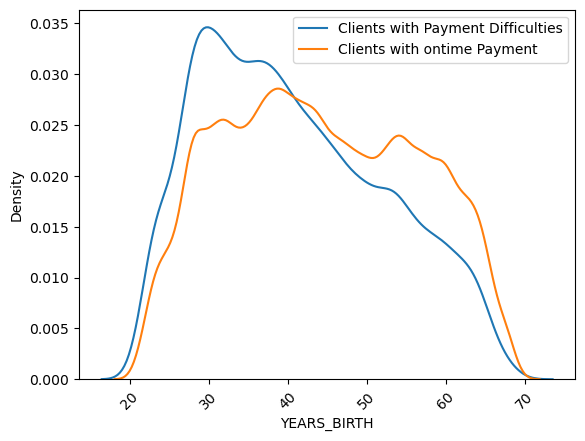

In [200]:
sns.distplot(df1[df1["YEARS_BIRTH"]<=Max1].YEARS_BIRTH,label="Clients with Payment Difficulties",hist=False)
sns.distplot(df0[df0["YEARS_BIRTH"]<=Max0].YEARS_BIRTH,label="Clients with ontime Payment ",hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [201]:
df1["AMT_GOODS_PRICE"].value_counts()

450000.0     3576
225000.0     2294
675000.0     2204
900000.0     1048
180000.0      854
             ... 
1543500.0       1
1242000.0       1
1656000.0       1
1903500.0       1
264600.0        1
Name: AMT_GOODS_PRICE, Length: 425, dtype: int64

In [202]:
##Getting the statistical information for the column
df1["AMT_GOODS_PRICE"].describe()

count    2.480400e+04
mean     4.889724e+05
std      3.116365e+05
min      4.500000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.750000e+05
max      3.600000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [203]:
##Lets check for the outlier in the column

In [204]:
Q1=df1["AMT_GOODS_PRICE"].quantile(0.25)
Q3=df1["AMT_GOODS_PRICE"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 436500.0


In [205]:
##Anything below Min1 and above Max1 are considered as outlier
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: -416250.0
Max value after which outlier exist: 1329750.0


In [206]:
df0["AMT_GOODS_PRICE"].value_counts()

225000.0     22988
675000.0     22758
450000.0     22446
900000.0     14368
270000.0     10598
             ...  
412227.0         1
2106000.0        1
894654.0         1
447804.0         1
743863.5         1
Name: AMT_GOODS_PRICE, Length: 948, dtype: int64

In [207]:
##Getting the statistical information for the column
df0["AMT_GOODS_PRICE"].describe()

count    2.824290e+05
mean     5.427368e+05
std      3.737855e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.885000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [208]:
##Lets check for the outlier in the column

In [209]:
Q1=df0["AMT_GOODS_PRICE"].quantile(0.25)
Q3=df0["AMT_GOODS_PRICE"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 450000.0


In [210]:
##Anything below Min1 and above Max1 are considered as outlier
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -436500.0
Max value after which outlier exist: 1363500.0


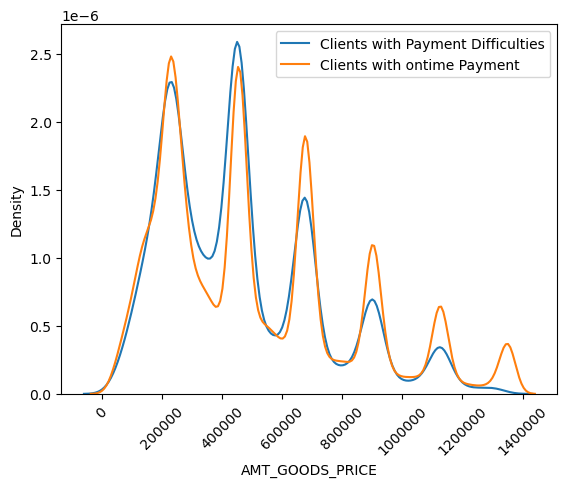

In [211]:
sns.distplot(df1[df1["AMT_GOODS_PRICE"]<=Max1].AMT_GOODS_PRICE,label="Clients with Payment Difficulties",hist=False)
sns.distplot(df0[df0["AMT_GOODS_PRICE"]<=Max0].AMT_GOODS_PRICE,label="Clients with ontime Payment ",hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [212]:
df1["DAYS_EMPLOYED"].value_counts()

365243    2990
234         31
241         23
398         22
212         21
          ... 
11887        1
6075         1
8007         1
4059         1
5168         1
Name: DAYS_EMPLOYED, Length: 5400, dtype: int64

In [213]:
##Getting the statistical information for the column
df1["DAYS_EMPLOYED"].describe()

count     24825.000000
mean      45587.324149
std      118303.300421
min           0.000000
25%         677.000000
50%        1458.000000
75%        3280.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [214]:
##Lets check for the outlier in the column

In [215]:
Q1=df1["DAYS_EMPLOYED"].quantile(0.25)
Q3=df1["DAYS_EMPLOYED"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 2603.0


In [216]:
##Anything below Min1 and above Max1 are considered as outlier
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: -3227.5
Max value after which outlier exist: 7184.5


In [217]:
# Analysis of "DAYS_EMPLOYED" with ontime Payment 

In [218]:
df0["DAYS_EMPLOYED"].value_counts()

365243    52384
224         139
230         136
229         135
200         135
          ...  
9787          1
13307         1
11336         1
7963          1
8694          1
Name: DAYS_EMPLOYED, Length: 12494, dtype: int64

In [219]:
##Getting the statistical information for the column
df0["DAYS_EMPLOYED"].describe()

count    282686.000000
mean      69668.812255
std      140983.356991
min           0.000000
25%         967.000000
50%        2304.000000
75%        6074.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [220]:
##Lets check for the outlier in the column

In [221]:
Q1=df0["DAYS_EMPLOYED"].quantile(0.25)
Q3=df0["DAYS_EMPLOYED"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 5107.0


In [222]:
##Anything below Min1 and above Max1 are considered as outlier
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -6693.5
Max value after which outlier exist: 13734.5


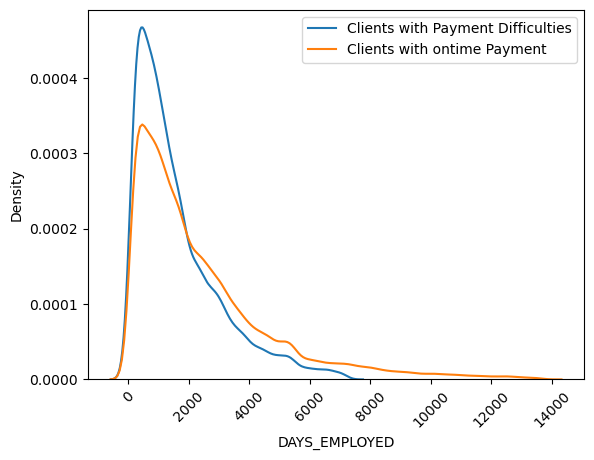

In [223]:
sns.distplot(df1[df1["DAYS_EMPLOYED"]<=Max1].DAYS_EMPLOYED,label="Clients with Payment Difficulties",hist=False)
sns.distplot(df0[df0["DAYS_EMPLOYED"]<=Max0].DAYS_EMPLOYED,label="Clients with ontime Payment ",hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [224]:
df1["CNT_CHILDREN"].value_counts()

0     16609
1      5454
2      2333
3       358
4        55
5         7
6         6
9         2
11        1
Name: CNT_CHILDREN, dtype: int64

In [225]:
##Getting the statistical info
df1["CNT_CHILDREN"].describe()

count    24825.000000
mean         0.463807
std          0.756903
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         11.000000
Name: CNT_CHILDREN, dtype: float64

In [226]:
Q1=df1["CNT_CHILDREN"].quantile(0.25)
Q3=df1["CNT_CHILDREN"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 1.0


In [227]:
##Anything below min1 and above max1 are considered as outliers
Min1=Q1-1.5*IQR
Max1=Q1+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: -1.5
Max value after which outlier exist: 1.5


In [228]:
df0["CNT_CHILDREN"].value_counts()

0     198762
1      55665
2      24416
3       3359
4        374
5         77
6         15
7          7
14         3
8          2
12         2
10         2
19         2
Name: CNT_CHILDREN, dtype: int64

In [229]:
##Getting the statistical info
df0["CNT_CHILDREN"].describe()

count    282686.000000
mean          0.412946
std           0.718843
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64

In [230]:
Q1=df0["CNT_CHILDREN"].quantile(0.25)
Q3=df0["CNT_CHILDREN"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 1.0


In [231]:
##Anything below min1 and above max1 are considered as outliers
Min0=Q1-1.5*IQR
Max0=Q1+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -1.5
Max value after which outlier exist: 1.5


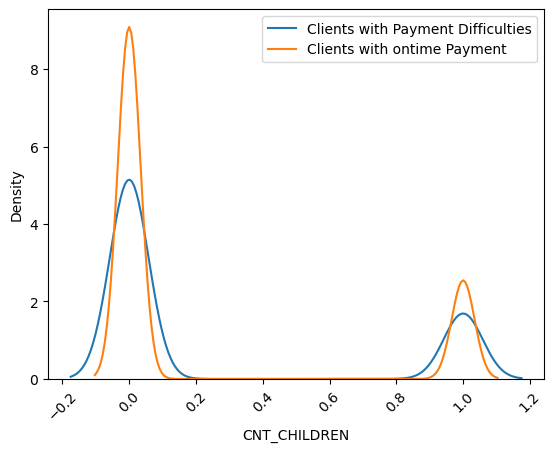

In [232]:
sns.distplot(df1[df1["CNT_CHILDREN"]<=Max1].CNT_CHILDREN,label="Clients with Payment Difficulties",hist=False)
sns.distplot(df0[df0["CNT_CHILDREN"]<=Max0].CNT_CHILDREN,label="Clients with ontime Payment ",hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

In [233]:
df1["AMT_INCOME_TOTAL"].value_counts()

135000.0     2983
112500.0     2720
157500.0     2307
180000.0     2083
90000.0      1844
             ... 
36436.5         1
250200.0        1
231750.0        1
1305000.0       1
190800.0        1
Name: AMT_INCOME_TOTAL, Length: 416, dtype: int64

In [234]:
##Getting the statistical info
df1["AMT_INCOME_TOTAL"].describe()

count    2.482500e+04
mean     1.656118e+05
std      7.466770e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.350000e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [235]:
Q1=df1["AMT_INCOME_TOTAL"].quantile(0.25)
Q3=df1["AMT_INCOME_TOTAL"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 90000.0


In [236]:
##Anything below min1 and above max1 are considered as outliers
Min1=Q1-1.5*IQR
Max1=Q1+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: -22500.0
Max value after which outlier exist: 247500.0


In [237]:
df0["AMT_INCOME_TOTAL"].value_counts()

135000.0    32767
112500.0    28299
157500.0    24249
180000.0    22636
90000.0     20639
            ...  
159435.0        1
123480.0        1
110475.0        1
163363.5        1
113062.5        1
Name: AMT_INCOME_TOTAL, Length: 2450, dtype: int64

In [238]:
##Getting the statistical info
df0["AMT_INCOME_TOTAL"].describe()

count    2.826860e+05
mean     1.690777e+05
std      1.104763e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.485000e+05
75%      2.025000e+05
max      1.800009e+07
Name: AMT_INCOME_TOTAL, dtype: float64

In [239]:
Q1=df0["AMT_INCOME_TOTAL"].quantile(0.25)
Q3=df0["AMT_INCOME_TOTAL"].quantile(0.75)
IQR=Q3-Q1
print("IQR is",IQR)

IQR is 90000.0


In [240]:
##Anything below min1 and above max1 are considered as outliers
Min0=Q1-1.5*IQR
Max0=Q1+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -22500.0
Max value after which outlier exist: 247500.0


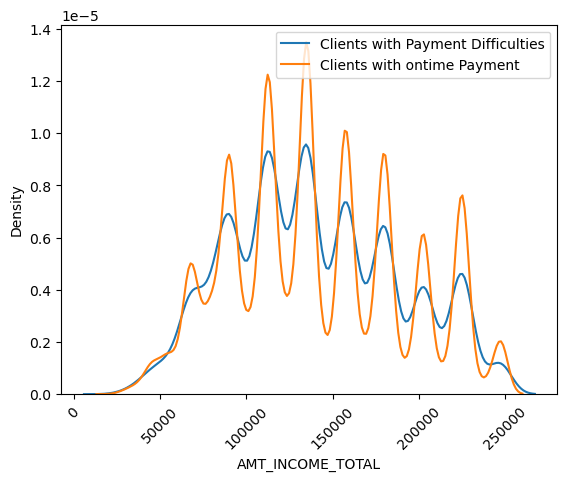

In [241]:
sns.distplot(df1[df1["AMT_INCOME_TOTAL"]<=Max1].AMT_INCOME_TOTAL,label="Clients with Payment Difficulties",hist=False)
sns.distplot(df0[df0["AMT_INCOME_TOTAL"]<=Max0].AMT_INCOME_TOTAL,label="Clients with ontime Payment ",hist=False)
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

# Bivariate/Multivariate analysis

              ###Analysis of "AMT_GOODS_PRICE" V/S "AMT_CREDIT"

In [242]:
Q1=df1["AMT_GOODS_PRICE"].quantile(0.25)
Q3=df1["AMT_GOODS_PRICE"].quantile(0.75)
IQR=Q3-Q1
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)


Min value before which outlier exist: -416250.0
Max value after which outlier exist: 1329750.0


In [243]:
Max1_AMT_GOODS_PRICE=1329750.0

In [244]:
Q1=df1["AMT_CREDIT"].quantile(0.25)
Q3=df1["AMT_CREDIT"].quantile(0.75)
IQR=Q3-Q1
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)



Min value before which outlier exist: -388973.25
Max value after which outlier exist: 1406688.75


In [245]:
Max1_AMT_CREDIT=1406688.75

In [246]:
Q1=df0["AMT_GOODS_PRICE"].quantile(0.25)
Q3=df0["AMT_GOODS_PRICE"].quantile(0.75)
IQR=Q3-Q1
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)


Min value before which outlier exist: -436500.0
Max value after which outlier exist: 1363500.0


In [247]:
Max0_AMT_GOODS_PRICE=1363500.0

In [248]:
Q1=df0["AMT_CREDIT"].quantile(0.25)
Q3=df0["AMT_CREDIT"].quantile(0.75)
IQR=Q3-Q1
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -540000.0
Max value after which outlier exist: 1620000.0


In [249]:
Max0_AMT_CREDIT=1620000.0

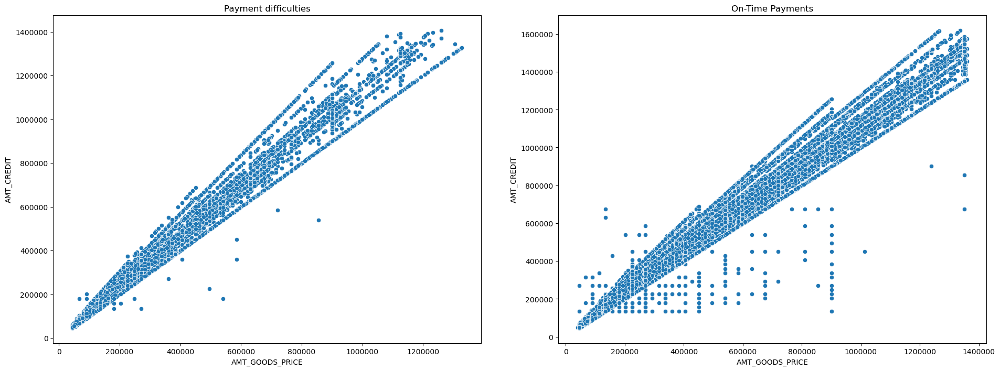

In [250]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = df1[df1['AMT_GOODS_PRICE'] < Max1_AMT_GOODS_PRICE].AMT_GOODS_PRICE, 
                y = df1[df1['AMT_CREDIT'] < Max1_AMT_CREDIT].AMT_CREDIT, data = df1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = df0[df0['AMT_GOODS_PRICE'] < Max0_AMT_GOODS_PRICE].AMT_GOODS_PRICE, 
                y = df0[df0['AMT_CREDIT'] < Max0_AMT_CREDIT].AMT_CREDIT, data = df0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [251]:
Q1=df1["AMT_ANNUITY"].quantile(0.25)
Q3=df1["AMT_ANNUITY"].quantile(0.75)
IQR=Q3-Q1
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)


Min value before which outlier exist: -6061.5
Max value after which outlier exist: 56398.5


In [252]:
Max1_AMT_ANNUITY= 56398.5

In [253]:
Max1_AMT_CREDIT

1406688.75

In [254]:
Q1=df0["AMT_ANNUITY"].quantile(0.25)
Q3=df0["AMT_ANNUITY"].quantile(0.75)
IQR=Q3-Q1
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -10982.25
Max value after which outlier exist: 62187.75


In [255]:
Max0_AMT_ANNUITY=62187.75

In [256]:
Max0_AMT_CREDIT

1620000.0

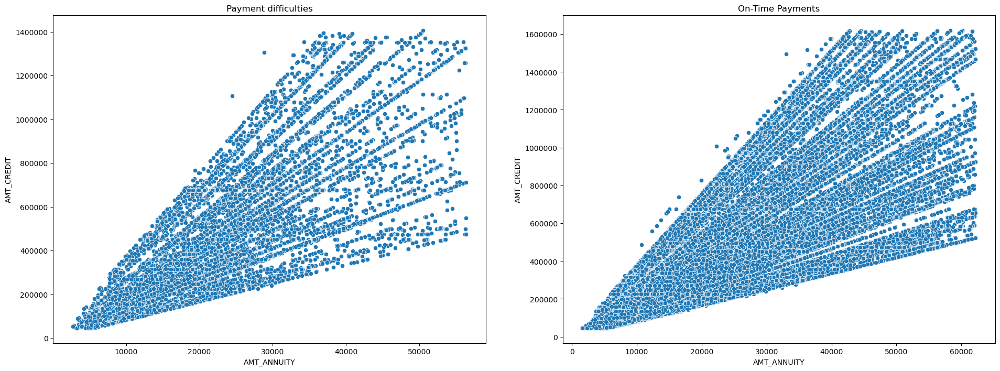

In [257]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = df1[df1['AMT_ANNUITY'] < Max1_AMT_ANNUITY].AMT_ANNUITY, 
                y = df1[df1['AMT_CREDIT'] < Max1_AMT_CREDIT].AMT_CREDIT, data = df1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = df0[df0['AMT_ANNUITY'] < Max0_AMT_ANNUITY].AMT_ANNUITY, 
                y = df0[df0['AMT_CREDIT'] < Max0_AMT_CREDIT].AMT_CREDIT, data = df0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [258]:
Q1=df1["DAYS_EMPLOYED"].quantile(0.25)
Q3=df1["DAYS_EMPLOYED"].quantile(0.75)
IQR=Q3-Q1
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: -3227.5
Max value after which outlier exist: 7184.5


In [259]:
Max1_DAYS_EMPLOYED=7184.5

In [260]:
Q1=df1["AMT_INCOME_TOTAL"].quantile(0.25)
Q3=df1["AMT_INCOME_TOTAL"].quantile(0.75)
IQR=Q3-Q1
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: -22500.0
Max value after which outlier exist: 337500.0


In [261]:
Max1_AMT_INCOME_TOTAL=337500.0

In [262]:
Q1=df0["DAYS_EMPLOYED"].quantile(0.25)
Q3=df0["DAYS_EMPLOYED"].quantile(0.75)
IQR=Q3-Q1
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -6693.5
Max value after which outlier exist: 13734.5


In [263]:
Max0_DAYS_EMPLOYED=13734.5

In [264]:
Q1=df0["AMT_INCOME_TOTAL"].quantile(0.25)
Q3=df0["AMT_INCOME_TOTAL"].quantile(0.75)
IQR=Q3-Q1
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: -22500.0
Max value after which outlier exist: 337500.0


In [265]:
Max0_AMT_INCOME_TOTAL=337500.0

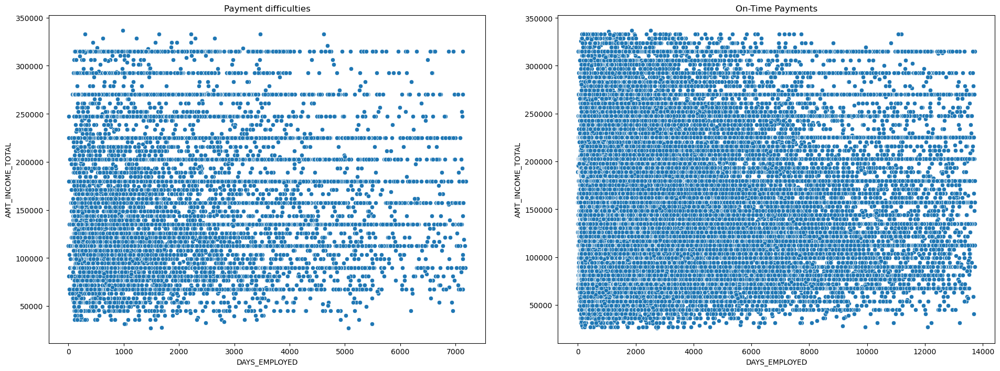

In [266]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = df1[df1['DAYS_EMPLOYED'] < Max1_DAYS_EMPLOYED].DAYS_EMPLOYED, 
                y = df1[df1['AMT_INCOME_TOTAL'] < Max1_AMT_INCOME_TOTAL].AMT_INCOME_TOTAL, data = df1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = df0[df0['DAYS_EMPLOYED'] < Max0_DAYS_EMPLOYED].DAYS_EMPLOYED, 
                y = df0[df0['AMT_INCOME_TOTAL'] < Max0_AMT_INCOME_TOTAL].AMT_INCOME_TOTAL, data = df0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [267]:
Max1_AMT_CREDIT

1406688.75

In [268]:
Q1=df1["DAYS_BIRTH"].quantile(0.25)
Q3=df1["DAYS_BIRTH"].quantile(0.75)
IQR=Q3-Q1
Min1=Q1-1.5*IQR
Max1=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min1)
print("Max value after which outlier exist:",Max1)

Min value before which outlier exist: 1434.5
Max value after which outlier exist: 27998.5


In [269]:
Max1_DAYS_BIRTH=27998.5

In [270]:
Max0_AMT_CREDIT

1620000.0

In [271]:
Q1=df0["DAYS_BIRTH"].quantile(0.25)
Q3=df0["DAYS_BIRTH"].quantile(0.75)
IQR=Q3-Q1
Min0=Q1-1.5*IQR
Max0=Q3+1.5*IQR
print("Min value before which outlier exist:" ,Min0)
print("Max value after which outlier exist:",Max0)

Min value before which outlier exist: 1649.375
Max value after which outlier exist: 30680.375


In [272]:
Max0_DAYS_BIRTH=30680.375

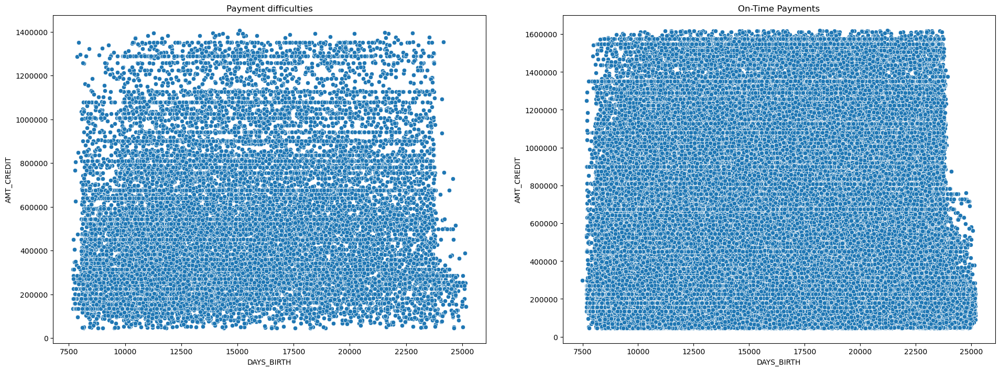

In [273]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = df1[df1['DAYS_BIRTH'] < Max1_DAYS_BIRTH].DAYS_BIRTH, 
                y = df1[df1['AMT_CREDIT'] < Max1_AMT_CREDIT].AMT_CREDIT, data = df1)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = df0[df0['DAYS_BIRTH'] < Max0_DAYS_BIRTH].DAYS_BIRTH, 
                y = df0[df0['AMT_CREDIT'] < Max0_AMT_CREDIT].AMT_CREDIT, data = df0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [274]:
Max1_AMT_ANNUITY

56398.5

In [275]:
Max1_AMT_GOODS_PRICE=1329750.0

In [276]:
Max0_AMT_ANNUITY

62187.75

In [277]:
Max0_AMT_GOODS_PRICE

1363500.0

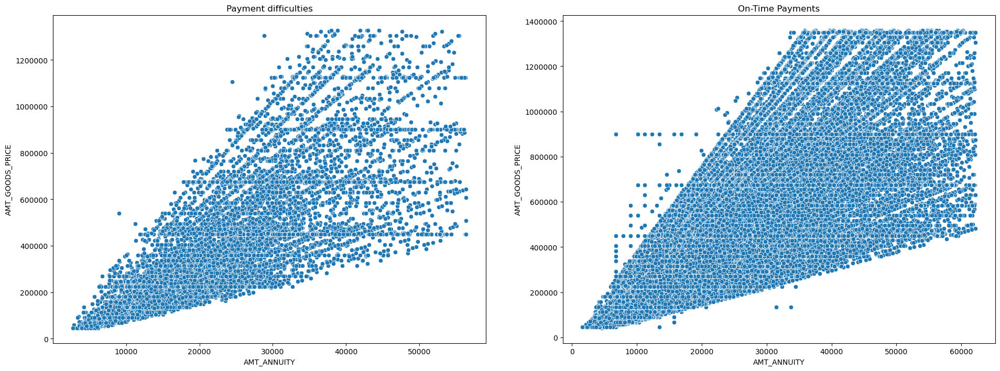

In [278]:
plt.figure(figsize = [20,8])

plt.subplot(1,2,1)
plt.title('Payment difficulties')
sns.scatterplot(x = df1[df1['AMT_ANNUITY'] < Max1_AMT_ANNUITY].AMT_ANNUITY, 
                y = df1[df1['AMT_GOODS_PRICE'] < Max1_AMT_GOODS_PRICE].AMT_GOODS_PRICE, data = df1)
                
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.subplot(1,2,2)
plt.title('On-Time Payments')
sns.scatterplot(x = df0[df0['AMT_ANNUITY'] < Max0_AMT_ANNUITY].AMT_ANNUITY, 
                y = df0[df0['AMT_GOODS_PRICE'] < Max0_AMT_GOODS_PRICE].AMT_GOODS_PRICE, data = df0)
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

# Continuous V/S Categorical variables

In [279]:
Max1_AMT_CREDIT

1406688.75

In [280]:
Max0_AMT_CREDIT

1620000.0

In [281]:
df1.groupby(by = ['NAME_EDUCATION_TYPE','CODE_GENDER']).AMT_CREDIT.describe().head()

count           mean            std  \
NAME_EDUCATION_TYPE CODE_GENDER                                         
Academic degree     F               3.0  950245.500000  504711.375348   
Higher education    F            2438.0  648500.581624  410415.703440   
                    M            1571.0  642070.944940  409695.934841   
Incomplete higher   F             504.0  520150.348214  352227.493127   
                    M             368.0  554723.816576  347843.706372   

                                      min       25%       50%          75%  \
NAME_EDUCATION_TYPE CODE_GENDER                                              
Academic degree     F            544491.0  667660.5  790830.0  1153122.750   
Higher education    F             47970.0  323595.0  545040.0   877500.000   
                    M             45000.0  329202.0  545040.0   832797.000   
Incomplete higher   F             91692.0  269550.0  450000.0   675000.000   
                    M             74628.0  284400.0  497520.0   699976.125   

                                       max  
NAME_EDUCATION_TYPE CODE_GENDER             
Academic degree     F            1515415.5  
Higher education    F            2687355.0  
                    M            2695500.0  
Incomplete higher   F            2695500.0  
                    M            2013840.0

In [282]:
df0.groupby(by = ['NAME_EDUCATION_TYPE','CODE_GENDER']).AMT_CREDIT.describe().head()

count           mean            std  \
NAME_EDUCATION_TYPE CODE_GENDER                                          
Academic degree     F               97.0  708770.737113  463052.418484   
                    M               64.0  735235.382812  497739.972619   
Higher education    F            47852.0  682485.002194  456642.778578   
                    M            23002.0  713144.543844  486073.660453   
Incomplete higher   F             5780.0  555340.534256  385980.597875   

                                      min       25%       50%        75%  \
NAME_EDUCATION_TYPE CODE_GENDER                                            
Academic degree     F            130824.0  354469.5  607500.0  1006920.0   
                    M             74182.5  309519.0  610056.0  1036890.0   
Higher education    F             45000.0  302206.5  568057.5   916470.0   
                    M             45000.0  315000.0  592560.0   973503.0   
Incomplete higher   F             45000.0  253737.0  454500.0   760225.5   

                                       max  
NAME_EDUCATION_TYPE CODE_GENDER             
Academic degree     F            2463840.0  
                    M            1984500.0  
Higher education    F            4050000.0  
                    M            4050000.0  
Incomplete higher   F            2517300.0

In [283]:
def fn_bi_boxplot(categorical,continuous,max_continuous1,max_continuous0,hue_column):
    plt.figure(figsize = [20,12])

    plt.subplot(1,2,1)
    plt.title('Payment Difficulties')
    red_diamond = dict(markerfacecolor='r', marker='D')
    sns.boxplot(x = categorical, 
                y = df1[df1[continuous] < max_continuous1][continuous], 
                data = df1, 
                flierprops = red_diamond, 
                order = sorted(df1[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.subplot(1,2,2)
    plt.title('On-Time Payments')
    sns.boxplot(x = categorical, 
                y = df0[df0[continuous] < max_continuous0][continuous], 
                data = df0, 
                flierprops = red_diamond, 
                order = sorted(df0[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.tight_layout(pad = 4)
    plt.show()

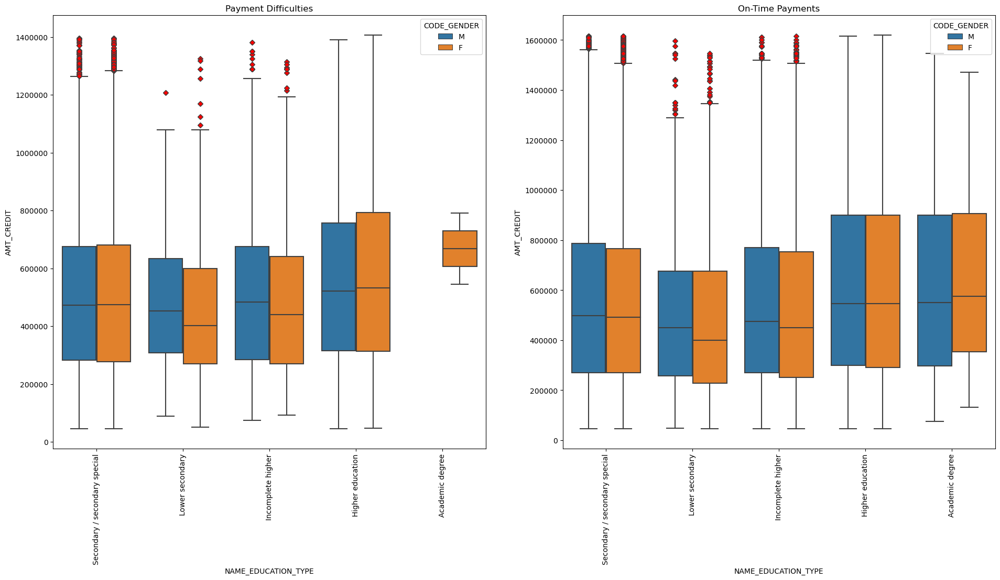

In [284]:
fn_bi_boxplot('NAME_EDUCATION_TYPE','AMT_CREDIT',Max1_AMT_CREDIT,Max0_AMT_CREDIT,'CODE_GENDER')

In [285]:
Max1_AMT_INCOME_TOTAL

337500.0

In [286]:
Max0_AMT_INCOME_TOTAL

337500.0

In [287]:
df1.groupby(by=["NAME_FAMILY_STATUS","CODE_GENDER"]).AMT_INCOME_TOTAL.describe().head()

count           mean           std      min  \
NAME_FAMILY_STATUS CODE_GENDER                                                 
Civil marriage     F            1753.0  153620.720194  1.010459e+05  25650.0   
                   M            1208.0  173949.988411  9.244917e+04  36000.0   
Married            F            8324.0  159907.850853  1.283283e+06  27000.0   
                   M            6526.0  182233.063975  9.478777e+04  31500.0   
Separated          F            1045.0  161159.546411  8.263333e+04  36000.0   

                                     25%       50%       75%          max  
NAME_FAMILY_STATUS CODE_GENDER                                             
Civil marriage     F            108000.0  135000.0  180000.0    3150000.0  
                   M            117000.0  157500.0  202500.0    1350000.0  
Married            F             90000.0  135000.0  180000.0  117000000.0  
                   M            126000.0  157500.0  225000.0    1890000.0  
Separated          F            112500.0  135000.0  202500.0     832500.0

In [288]:
df0.groupby(by=["NAME_FAMILY_STATUS","CODE_GENDER"]).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_FAMILY_STATUS CODE_GENDER                                           
Civil marriage     F             19017.0  162086.054245  106811.493431   
                   M              7797.0  184126.294363  106559.488198   
Married            F            114125.0  154289.532323   88593.427099   
                   M             67459.0  199592.828178  147599.764903   
Separated          F             14416.0  166374.209767   94782.184577   

                                    min       25%       50%       75%  \
NAME_FAMILY_STATUS CODE_GENDER                                          
Civil marriage     F            27000.0  112500.0  135000.0  202500.0   
                   M            27000.0  121500.0  157500.0  225000.0   
Married            F            26100.0   94500.0  135000.0  180000.0   
                   M            27000.0  135000.0  180000.0  225000.0   
Separated          F            27000.0  112500.0  139500.0  202500.0   

                                       max  
NAME_FAMILY_STATUS CODE_GENDER              
Civil marriage     F             9000000.0  
                   M             3825000.0  
Married            F             3600000.0  
                   M            18000090.0  
Separated          F             2250000.0

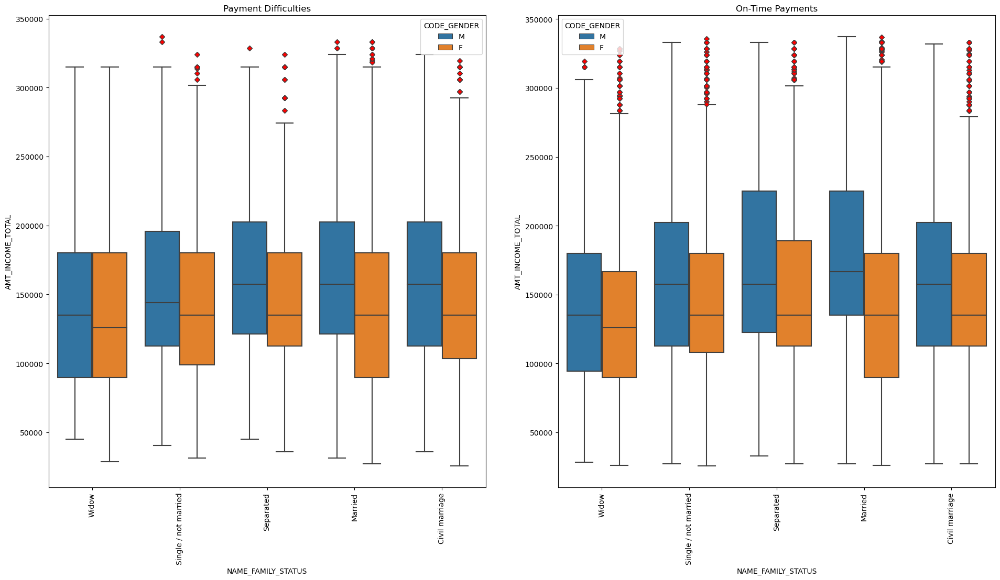

In [289]:
fn_bi_boxplot('NAME_FAMILY_STATUS','AMT_INCOME_TOTAL',Max1_AMT_INCOME_TOTAL,Max0_AMT_INCOME_TOTAL,'CODE_GENDER')

In [290]:
Max1_AMT_GOODS_PRICE

1329750.0

In [291]:
Max0_AMT_GOODS_PRICE

1363500.0

In [292]:
df1.groupby(by=["NAME_INCOME_TYPE","CODE_GENDER"]).AMT_GOODS_PRICE.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                         
Commercial associate F            2966.0  536362.214262  353710.652628   
                     M            2391.0  526387.309912  335859.941286   
Maternity leave      F               2.0  929250.000000  715945.615951   
Pensioner            F            2241.0  495016.255020  317042.451456   
                     M             739.0  486543.075101  321104.431714   

                                       min       25%       50%        75%  \
NAME_INCOME_TYPE     CODE_GENDER                                            
Commercial associate F             45000.0  270000.0  450000.0   675000.0   
                     M             45000.0  270000.0  450000.0   675000.0   
Maternity leave      F            423000.0  676125.0  929250.0  1182375.0   
Pensioner            F             45000.0  229500.0  450000.0   675000.0   
                     M             45000.0  229500.0  450000.0   675000.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Commercial associate F            3600000.0  
                     M            2961000.0  
Maternity leave      F            1435500.0  
Pensioner            F            2173500.0  
                     M            1800000.0

In [293]:
df0.groupby(by=["NAME_INCOME_TYPE","CODE_GENDER"]).AMT_GOODS_PRICE.describe().head()

count          mean           std  \
NAME_INCOME_TYPE     CODE_GENDER                                        
Businessman          F                3.0  1.125000e+06  1.031080e+06   
                     M                7.0  1.272857e+06  7.551041e+05   
Commercial associate F            41522.0  6.022426e+05  4.008250e+05   
                     M            24691.0  6.202202e+05  4.224455e+05   
Maternity leave      F                2.0  5.625000e+05  3.500179e+05   

                                       min       25%        50%        75%  \
NAME_INCOME_TYPE     CODE_GENDER                                             
Businessman          F            225000.0  562500.0   900000.0  1575000.0   
                     M            495000.0  607500.0  1350000.0  1800000.0   
Commercial associate F             45000.0  270000.0   472500.0   837000.0   
                     M             45000.0  270000.0   472500.0   900000.0   
Maternity leave      F            315000.0  438750.0   562500.0   686250.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Businessman          F            2250000.0  
                     M            2250000.0  
Commercial associate F            4050000.0  
                     M            4050000.0  
Maternity leave      F             810000.0

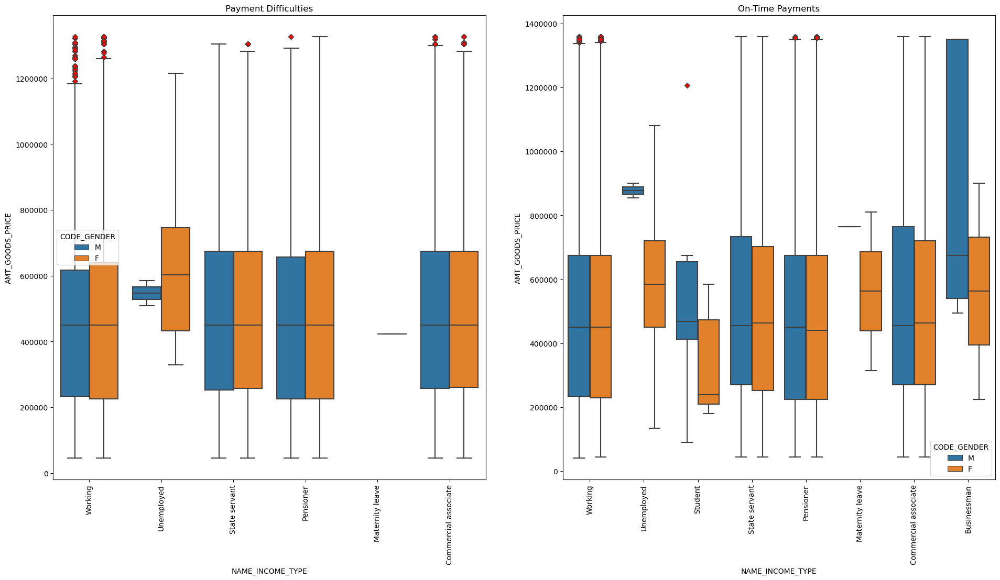

In [294]:
fn_bi_boxplot('NAME_INCOME_TYPE','AMT_GOODS_PRICE',Max1_AMT_GOODS_PRICE,Max0_AMT_GOODS_PRICE,'CODE_GENDER')

In [295]:
Max1_AMT_INCOME_TOTAL

337500.0

In [296]:
Max0_AMT_INCOME_TOTAL

337500.0

In [297]:
df1.groupby(by=["NAME_INCOME_TYPE","CODE_GENDER"]).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                         
Commercial associate F            2968.0  172962.535209   94922.968878   
                     M            2392.0  207145.505017  120281.013430   
Maternity leave      F               2.0   58500.000000   12727.922061   
Pensioner            F            2243.0  133275.589166   71580.630080   
                     M             739.0  142481.259134   76941.738672   

                                      min       25%       50%       75%  \
NAME_INCOME_TYPE     CODE_GENDER                                          
Commercial associate F            36000.0  112500.0  157500.0  202500.0   
                     M            45000.0  135000.0  180000.0  225000.0   
Maternity leave      F            49500.0   54000.0   58500.0   63000.0   
Pensioner            F            25650.0   90000.0  117000.0  157500.0   
                     M            31500.0   90000.0  135000.0  180000.0   

                                        max  
NAME_INCOME_TYPE     CODE_GENDER             
Commercial associate F            1575000.0  
                     M            1890000.0  
Maternity leave      F              67500.0  
Pensioner            F            1260000.0  
                     M             585000.0

In [298]:
df0.groupby(by=["NAME_INCOME_TYPE","CODE_GENDER"]).AMT_INCOME_TOTAL.describe().head()

count           mean            std  \
NAME_INCOME_TYPE     CODE_GENDER                                          
Businessman          F                3.0  555000.000000  337749.907476   
                     M                7.0  694285.714286  738446.728904   
Commercial associate F            41552.0  187223.556855  108354.861814   
                     M            24705.0  232612.571849  199602.652415   
Maternity leave      F                2.0  112500.000000   31819.805153   

                                       min       25%       50%       75%  \
NAME_INCOME_TYPE     CODE_GENDER                                           
Businessman          F            225000.0  382500.0  540000.0  720000.0   
                     M            180000.0  202500.0  450000.0  787500.0   
Commercial associate F             26550.0  117000.0  157500.0  225000.0   
                     M             36000.0  157500.0  202500.0  270000.0   
Maternity leave      F             90000.0  101250.0  112500.0  123750.0   

                                         max  
NAME_INCOME_TYPE     CODE_GENDER              
Businessman          F              900000.0  
                     M             2250000.0  
Commercial associate F             3600000.0  
                     M            18000090.0  
Maternity leave      F              135000.0

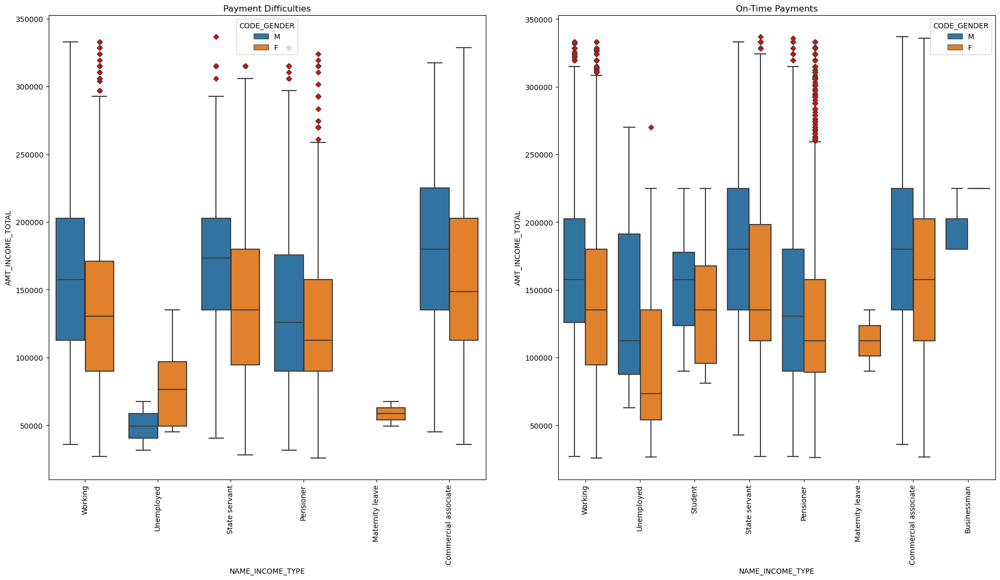

In [299]:
fn_bi_boxplot('NAME_INCOME_TYPE','AMT_INCOME_TOTAL',Max1_AMT_INCOME_TOTAL,Max0_AMT_INCOME_TOTAL,'CODE_GENDER')

In [300]:
Max1_AMT_INCOME_TOTAL

337500.0

In [301]:
Max0_AMT_INCOME_TOTAL

337500.0

In [302]:
df1.groupby(["OCCUPATION_TYPE","CODE_GENDER"]).AMT_INCOME_TOTAL.describe().head()

count           mean           std      min  \
OCCUPATION_TYPE CODE_GENDER                                                
Accountants     F            457.0  174840.636761  79021.040323  54000.0   
                M             17.0  202367.647059  98623.658009  81000.0   
Cleaning staff  F            410.0  128907.987805  70328.229454  31500.0   
                M             37.0  119493.243243  45786.206320  45000.0   
Cooking staff   F            555.0  129298.378378  55531.877347  32400.0   

                                  25%       50%       75%       max  
OCCUPATION_TYPE CODE_GENDER                                          
Accountants     F            112500.0  157500.0  202500.0  540000.0  
                M            121500.0  180000.0  252000.0  438750.0  
Cleaning staff  F             90000.0  112500.0  157500.0  720000.0  
                M             90000.0  112500.0  135000.0  247500.0  
Cooking staff   F             90000.0  112500.0  157500.0  405000.0

In [303]:
df0.groupby(["OCCUPATION_TYPE","CODE_GENDER"]).AMT_INCOME_TOTAL.describe().head()

count           mean            std      min  \
OCCUPATION_TYPE CODE_GENDER                                                  
Accountants     F            9072.0  194324.507937  109135.608131  27000.0   
                M             267.0  236490.893258  131795.325488  54000.0   
Cleaning staff  F            3904.0  130602.052254   63495.045291  25650.0   
                M             302.0  137172.516556   64373.090447  31500.0   
Cooking staff   F            4830.0  134460.402922   60213.558132  27000.0   

                                  25%       50%       75%        max  
OCCUPATION_TYPE CODE_GENDER                                           
Accountants     F            130500.0  175500.0  225000.0  2214117.0  
                M            141750.0  216000.0  270000.0  1035000.0  
Cleaning staff  F             90000.0  112500.0  157500.0  1080000.0  
                M             90000.0  132750.0  169875.0   450000.0  
Cooking staff   F             90000.0  121500.0  157500.0   540000.0

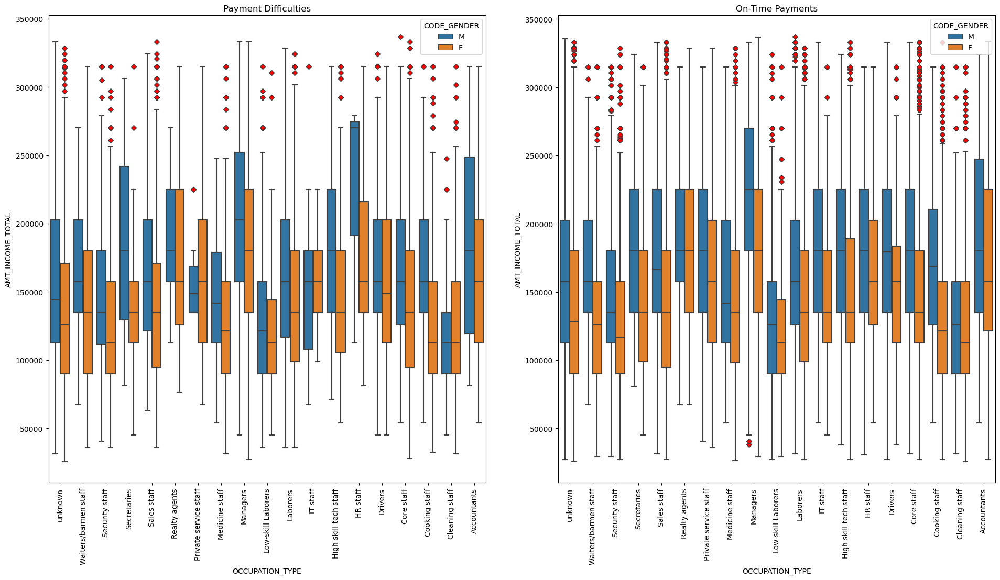

In [304]:
fn_bi_boxplot('OCCUPATION_TYPE','AMT_INCOME_TOTAL',Max1_AMT_INCOME_TOTAL,Max0_AMT_INCOME_TOTAL,'CODE_GENDER')

# Categorical V/S Categorical variables

In [305]:
def fn_bi_countplot(column,hue_column):
    plt.figure(figsize=[20,8])
    palt=sns.color_palette("bright")
    
    plt.subplot(1,2,1)
    pltname="Clients with difficulty in Payment"
    plt.title(pltname)
    sns.countplot(x = column, data = df1, 
                  order = sorted(df1[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(df1[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)
    
    plt.subplot(1,2,2)
    pltname = 'Clients with on-time payments'
    plt.title(pltname)
    sns.countplot(x = column, data = df0, 
                  order = sorted(df0[column].unique(), reverse = True), palette = palt,
                  hue = hue_column, hue_order = sorted(df0[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

In [306]:
  #### Analysis of NAME_INCOME_TYPE V/S CODE_GENDER

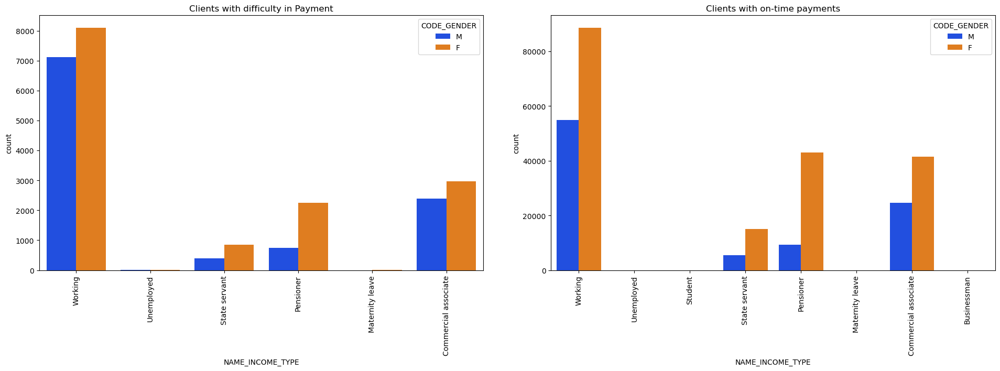

In [307]:
fn_bi_countplot("NAME_INCOME_TYPE","CODE_GENDER")

In [308]:
    ####Analysis of NAME_EDUCATION_TYPE V/S CODE_GENDER

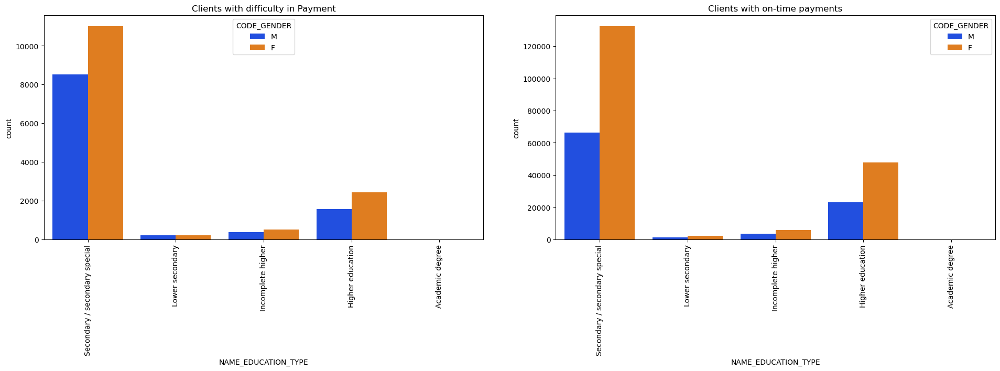

In [309]:
fn_bi_countplot("NAME_EDUCATION_TYPE","CODE_GENDER")

In [310]:
    ####Analysis of NAME_FAMILY_STATUS V/S OCCUPATION_TYPE

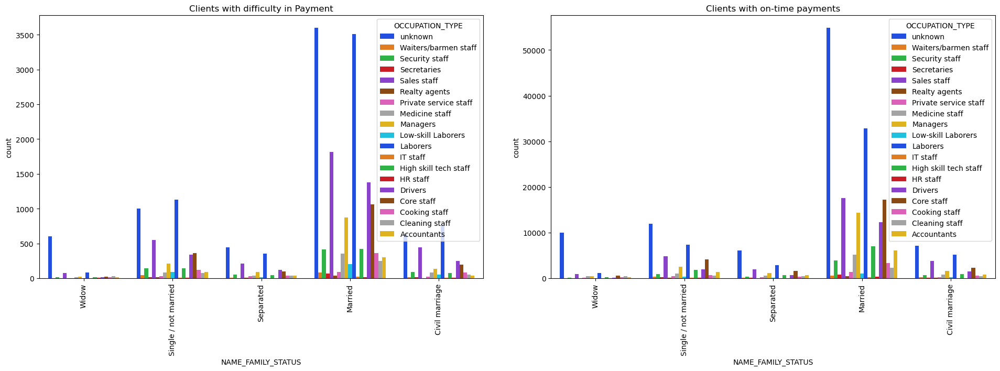

In [311]:
fn_bi_countplot("NAME_FAMILY_STATUS","OCCUPATION_TYPE")

In [312]:
      ###Analysis of ORGANIZATION_TYPE V/S FLAG_OWN_CAR

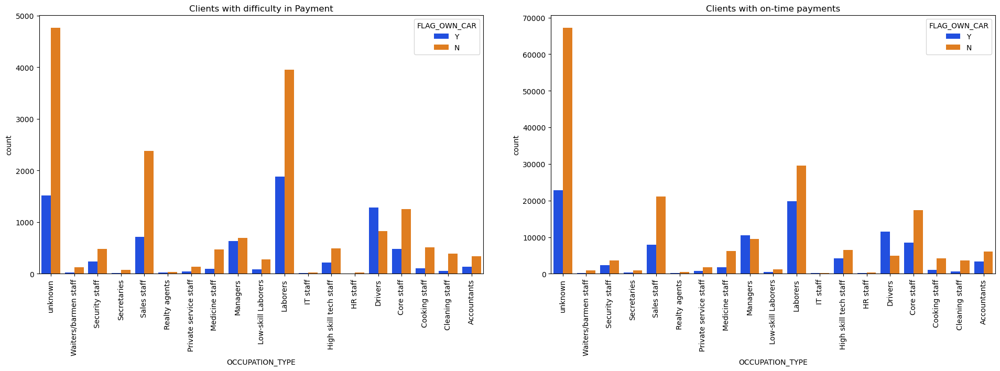

In [313]:
fn_bi_countplot("OCCUPATION_TYPE","FLAG_OWN_CAR")

In [314]:
     ####Analysis of OCCUPATION_TYPE V/S NAME_CONTRACT_TYPE

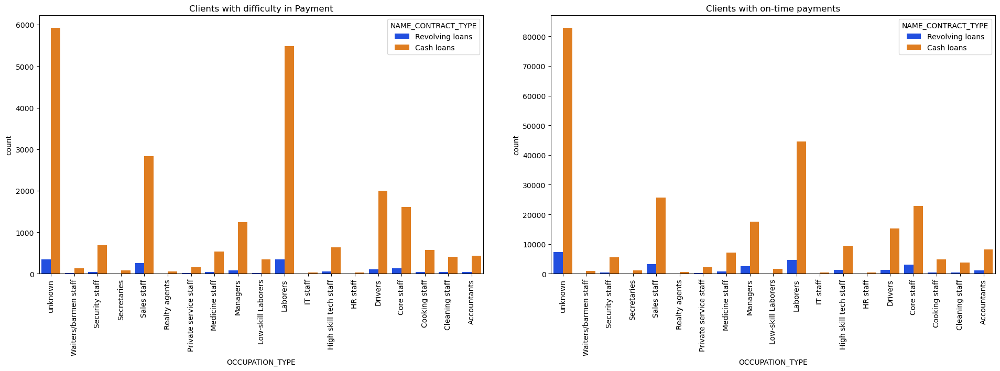

In [315]:
fn_bi_countplot("OCCUPATION_TYPE","NAME_CONTRACT_TYPE")

# Previous Application Data

In [316]:
df_prev=pd.read_csv("previous_application.csv")
df_prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [317]:
df_prev.shape

(1670214, 37)

In [318]:
#Checking the datatypes and null values in columns and dealing with the wrong datatypes
df_prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [319]:
##Getting statistical information
df_prev.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [320]:
#Now let us analyze categorical variable

In [321]:
df_prev.select_dtypes(include="object").columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [322]:
len(df_prev.select_dtypes(include="object").columns)

16

In [323]:
#Now let us analyze continuous variable

In [324]:
df_prev.select_dtypes(include=["float","int"]).columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [325]:
len(df_prev.select_dtypes(include=["float","int"]).columns)

21

In [326]:
##Dealing with the missing values

In [327]:
df_prev.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [328]:
df_prev.isnull().values.sum()

11109336

In [329]:
##Now lets get the list of the columns that have null values

In [330]:
df_prev.columns[df_prev.isnull().any()]

Index(['AMT_ANNUITY', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'CNT_PAYMENT',
       'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [331]:
len(df_prev.columns[df_prev.isnull().any()])

16

In [332]:
##Now let's count the percentage of the missing values in each column and then we will take decisions after that

In [333]:
df_prev_null_count=df_prev.isnull().sum()
df_prev_null_percentage=round((df_prev_null_count/df_prev.shape[0])*100,2)

In [334]:
prev_null_df=pd.DataFrame({"Column_name":df_prev.columns,"Null_count":df_prev_null_count,"Null_count_percentage":df_prev_null_percentage})
prev_null_df.reset_index(drop=True,inplace=True)
prev_null_df.sort_values(by="Null_count_percentage",ascending=False)

,Column_name,Null_count,Null_count_percentage
14,RATE_INTEREST_PRIVILEGED,1664263,99.64
13,RATE_INTEREST_PRIMARY,1664263,99.64
12,RATE_DOWN_PAYMENT,895844,53.64
6,AMT_DOWN_PAYMENT,895844,53.64
20,NAME_TYPE_SUITE,820405,49.12
36,NFLAG_INSURED_ON_APPROVAL,673065,40.30
31,DAYS_FIRST_DRAWING,673065,40.30
32,DAYS_FIRST_DUE,673065,40.30
33,DAYS_LAST_DUE_1ST_VERSION,673065,40.30
34,DAYS_LAST_DUE,673065,40.30


In [335]:
##Deleting the columns that are having missing values more then 40%

In [336]:
col_not_needed=prev_null_df[prev_null_df["Null_count_percentage"]>40]
col_not_needed["Column_name"]

6              AMT_DOWN_PAYMENT
12            RATE_DOWN_PAYMENT
13        RATE_INTEREST_PRIMARY
14     RATE_INTEREST_PRIVILEGED
20              NAME_TYPE_SUITE
31           DAYS_FIRST_DRAWING
32               DAYS_FIRST_DUE
33    DAYS_LAST_DUE_1ST_VERSION
34                DAYS_LAST_DUE
35             DAYS_TERMINATION
36    NFLAG_INSURED_ON_APPROVAL
Name: Column_name, dtype: object

In [337]:
len(col_not_needed)

11

In [338]:
##Removing thee col_not_needed from the main data
df_prev.drop(columns=col_not_needed["Column_name"],inplace=True)

In [339]:
df_prev.shape

(1670214, 26)

In [340]:
##Checking the column that have missing values less then 40%

In [341]:
null_df_under40=prev_null_df[prev_null_df["Null_count_percentage"]<40]


In [342]:
null_df_under40.sort_values(by="Null_count_percentage",ascending=False)

,Column_name,Null_count,Null_count_percentage
7,AMT_GOODS_PRICE,385515,23.08
3,AMT_ANNUITY,372235,22.29
28,CNT_PAYMENT,372230,22.29
30,PRODUCT_COMBINATION,346,0.02
18,NAME_PAYMENT_TYPE,0,0.00
29,NAME_YIELD_GROUP,0,0.00
27,NAME_SELLER_INDUSTRY,0,0.00
26,SELLERPLACE_AREA,0,0.00
25,CHANNEL_TYPE,0,0.00
24,NAME_PRODUCT_TYPE,0,0.00


Analysis of "AMT_GOODS_PRICE" Column

In [343]:
df_prev.AMT_GOODS_PRICE.value_counts().head()

45000.0     47831
225000.0    43549
135000.0    40666
450000.0    38926
90000.0     29367
Name: AMT_GOODS_PRICE, dtype: int64

In [344]:
#let's plot a box plot so that we can get the idea of distribution ,mean ,median,outliers

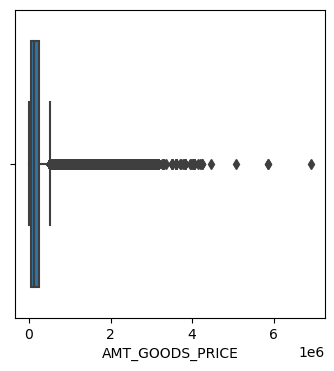

In [345]:
plt.figure(figsize=[4,4])
sns.boxplot(df_prev["AMT_GOODS_PRICE"])
plt.show()

In [346]:
##Lets check the values at different percentiles
df_prev.AMT_GOODS_PRICE.quantile(q=[0.25,0.5,0.75,1])

0.25      50841.0
0.50     112320.0
0.75     234000.0
1.00    6905160.0
Name: AMT_GOODS_PRICE, dtype: float64

In [347]:
df_prev.AMT_GOODS_PRICE.mean()

227847.27928334344

In [348]:
df_prev.AMT_GOODS_PRICE.median()

112320.0

In [349]:
##Getting the most reccuring values
df_prev.AMT_GOODS_PRICE.mode()[0]

45000.0

In [350]:
df_prev.AMT_ANNUITY.value_counts().head()

2250.0     31865
11250.0    13974
6750.0     13442
9000.0     12496
22500.0    11903
Name: AMT_ANNUITY, dtype: int64

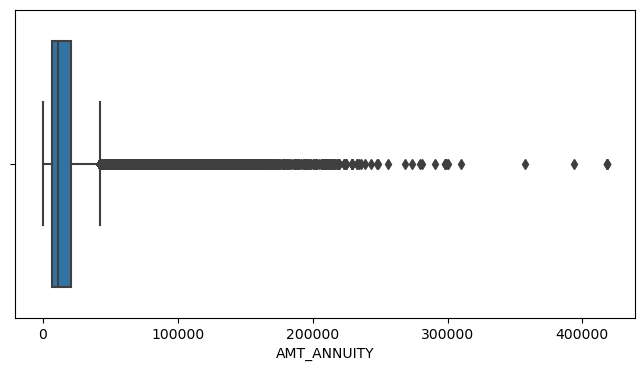

In [351]:
plt.figure(figsize=[8,4])
sns.boxplot(df_prev.AMT_ANNUITY)
plt.show()

In [352]:
df_prev.AMT_ANNUITY.quantile(q=[0.25,0.5,0.75,1])

0.25      6321.780
0.50     11250.000
0.75     20658.420
1.00    418058.145
Name: AMT_ANNUITY, dtype: float64

In [353]:
df_prev.AMT_ANNUITY.mean()

15955.120659450406

In [354]:
df_prev.AMT_ANNUITY.median()

11250.0

In [355]:
df_prev.AMT_ANNUITY.mode()[0]

2250.0

In [356]:
##Analysis of CNT_PAYMENT column

In [357]:
df_prev.CNT_PAYMENT.value_counts()

12.0    323049
6.0     190461
0.0     144985
10.0    141851
24.0    137764
18.0     77430
36.0     72583
60.0     53600
48.0     47316
8.0      30349
4.0      26924
30.0     16924
14.0      8253
42.0      7136
16.0      5710
5.0       3957
54.0      2104
20.0      1805
7.0       1434
9.0       1236
3.0       1100
15.0       904
11.0       669
72.0       139
13.0        51
17.0        48
84.0        45
22.0        37
23.0        27
26.0        13
35.0        11
66.0        10
28.0         8
29.0         8
32.0         6
19.0         6
34.0         4
59.0         4
41.0         3
47.0         3
45.0         3
21.0         3
44.0         2
39.0         2
46.0         2
38.0         2
33.0         1
40.0         1
53.0         1
Name: CNT_PAYMENT, dtype: int64

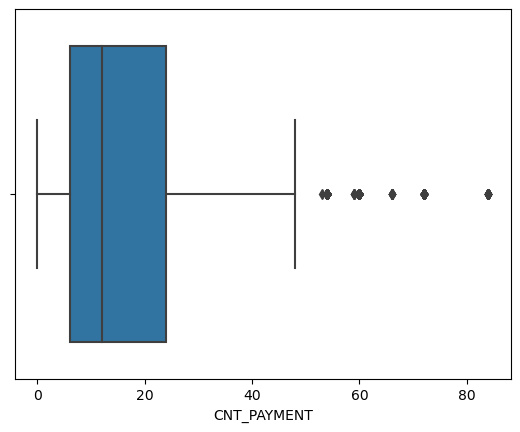

In [358]:
sns.boxplot(df_prev.CNT_PAYMENT)
plt.show()

In [359]:
df_prev.CNT_PAYMENT.mean()

16.0540815603274

In [360]:
df_prev.CNT_PAYMENT.median()

12.0

In [361]:
df_prev.CNT_PAYMENT.mode()[0]

12.0

In [362]:
##Checking the columns that have missing values less then 1% and greater then 0%

In [363]:
null_df_under_1=prev_null_df[(prev_null_df["Null_count_percentage"]>0) & (prev_null_df["Null_count_percentage"]<1)]

In [364]:
null_df_under_1

,Column_name,Null_count,Null_count_percentage
30,PRODUCT_COMBINATION,346,0.02


In [365]:
##Anlysis of Product_combination column

In [366]:
df_prev.PRODUCT_COMBINATION.value_counts()

Cash                              285990
POS household with interest       263622
POS mobile with interest          220670
Cash X-Sell: middle               143883
Cash X-Sell: low                  130248
Card Street                       112582
POS industry with interest         98833
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34658
Cash Street: low                   33834
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64

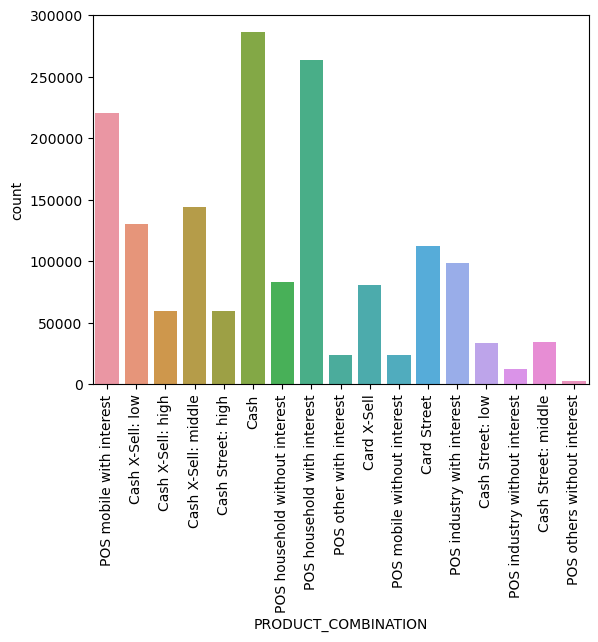

In [367]:
sns.countplot(x=df_prev.PRODUCT_COMBINATION)
plt.xticks(rotation=90)
plt.show()

In [368]:
df_prev.PRODUCT_COMBINATION.mode()[0]

'Cash'

----------------Dealing with incorrect/unknown data values

In [369]:
##Analysis of NAME_CASH_LOAN_PURPOSE column

In [370]:
df_prev.NAME_CASH_LOAN_PURPOSE.value_counts(normalize=True)*100

XAP                                 55.242083
XNA                                 40.588691
Repairs                              1.422872
Other                                0.934491
Urgent needs                         0.503648
Buying a used car                    0.172912
Building a house or an annex         0.161237
Everyday expenses                    0.144652
Medicine                             0.130163
Payments on other loans              0.115614
Education                            0.094180
Journey                              0.074182
Purchase of electronic equipment     0.063525
Buying a new car                     0.060591
Wedding / gift / holiday             0.057597
Buying a home                        0.051790
Car repairs                          0.047718
Furniture                            0.044845
Buying a holiday home / land         0.031912
Business development                 0.025506
Gasification / water supply          0.017962
Buying a garage                   

In [371]:
##Analysis of DAYS_DECISION column

In [372]:
df_prev. DAYS_DECISION.value_counts()

-245     2444
-238     2390
-210     2375
-273     2350
-196     2315
         ... 
-2882     163
-2922     162
-2921     158
-2902     148
-1          2
Name: DAYS_DECISION, Length: 2922, dtype: int64

In [373]:
df_prev["DAYS_DECISION"]=df_prev.DAYS_DECISION.apply(lambda x:-x if x<0 else x)

In [374]:
##Checking again if data converts as per our requirements
df_prev.DAYS_DECISION.value_counts()

245     2444
238     2390
210     2375
273     2350
196     2315
        ... 
2882     163
2922     162
2921     158
2902     148
1          2
Name: DAYS_DECISION, Length: 2922, dtype: int64

In [375]:
##Analysis of NAME_PAYMENT_TYPE column

In [376]:
df_prev.NAME_PAYMENT_TYPE.value_counts(normalize=True)*100

Cash through the bank                        61.881412
XNA                                          37.563091
Non-cash from your account                    0.490536
Cashless from the account of the employer     0.064962
Name: NAME_PAYMENT_TYPE, dtype: float64

In [377]:
##Analysis of CODE_REJECT_REASON column

In [378]:
df_prev.CODE_REJECT_REASON.value_counts(normalize=True)*100

XAP       81.013152
HC        10.491530
LIMIT      3.333705
SCO        2.243245
CLIENT     1.582791
SCOFR      0.767027
XNA        0.313972
VERIF      0.211650
SYSTEM     0.042929
Name: CODE_REJECT_REASON, dtype: float64

In [379]:
##Analysis of NAME_CLIENT_TYPE column

In [380]:
df_prev.NAME_CLIENT_TYPE.value_counts(normalize=True)*100

Repeater     73.718757
New          18.043376
Refreshed     8.121654
XNA           0.116213
Name: NAME_CLIENT_TYPE, dtype: float64

In [381]:
df_prev['NAME_CLIENT_TYPE'] = df_prev['NAME_CLIENT_TYPE'].apply(lambda x: 'Repeater' if x == 'XNA' else x)

In [382]:
#Again checking the values if XNA is removed or not
df_prev.NAME_CLIENT_TYPE.value_counts(normalize=True)*100

Repeater     73.834970
New          18.043376
Refreshed     8.121654
Name: NAME_CLIENT_TYPE, dtype: float64

In [383]:
df_prev["AMT_ANNUITY"].value_counts()

2250.000     31865
11250.000    13974
6750.000     13442
9000.000     12496
22500.000    11903
             ...  
3794.445         1
8723.160         1
27948.330        1
25374.285        1
14704.290        1
Name: AMT_ANNUITY, Length: 357959, dtype: int64

In [384]:
df_prev["AMT_ANNUITY"].quantile(q=[0.25,0.5,0.75,0.99,1])

0.25      6321.7800
0.50     11250.0000
0.75     20658.4200
0.99     69685.7886
1.00    418058.1450
Name: AMT_ANNUITY, dtype: float64

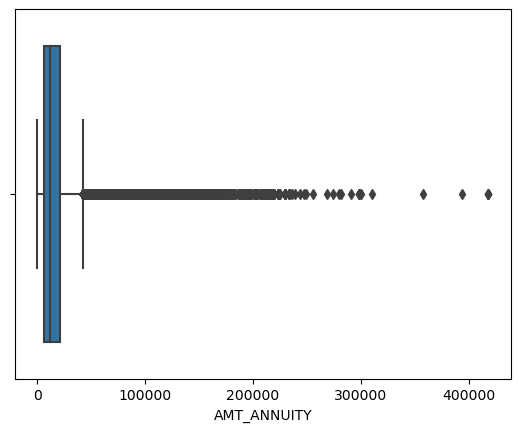

In [385]:
sns.boxplot(df_prev["AMT_ANNUITY"])
plt.show()

In [386]:
Q1 = df_prev['AMT_ANNUITY'].quantile(0.25)
Q3 = df_prev['AMT_ANNUITY'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

14336.64


In [387]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -15183.18
Max value after which outlier exist: 42163.38


In [388]:
##Analysis of AMT_APPLICATION column

In [389]:
df_prev["AMT_APPLICATION"].value_counts()

0.00         392402
45000.00      47831
225000.00     43543
135000.00     40678
450000.00     38905
              ...  
185292.00         1
225054.00         1
156212.55         1
99896.31          1
267295.50         1
Name: AMT_APPLICATION, Length: 93885, dtype: int64

In [390]:
df_prev["AMT_APPLICATION"].quantile(q=[0.25,0.5,0.75,0.99,1])

0.25      18720.0
0.50      71046.0
0.75     180360.0
0.99    1350000.0
1.00    6905160.0
Name: AMT_APPLICATION, dtype: float64

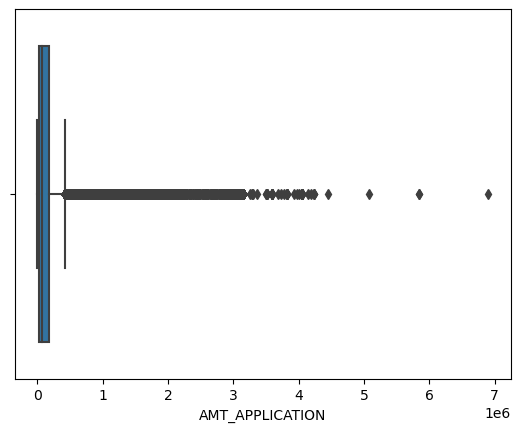

In [391]:
sns.boxplot(df_prev["AMT_APPLICATION"])
plt.show()

In [392]:
Q1 = df_prev['AMT_APPLICATION'].quantile(0.25)
Q3 = df_prev['AMT_APPLICATION'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

161640.0


In [393]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -223740.0
Max value after which outlier exist: 422820.0


In [394]:
df_prev["AMT_CREDIT"].value_counts()

0.00         336768
45000.00      35051
225000.00     21094
450000.00     19954
135000.00     18720
              ...  
262768.50         1
354213.00         1
438817.50         1
253111.50         1
436370.22         1
Name: AMT_CREDIT, Length: 86803, dtype: int64

In [395]:
df_prev["AMT_CREDIT"].quantile(q=[0.25,0.5,0.75,0.99,1])

0.25      24160.5
0.50      80541.0
0.75     216418.5
0.99    1515377.7
1.00    6905160.0
Name: AMT_CREDIT, dtype: float64

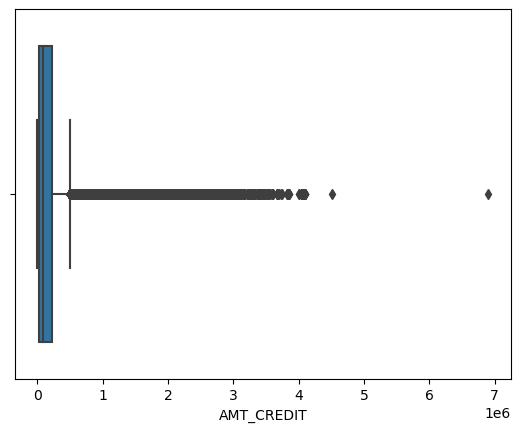

In [396]:
sns.boxplot(df_prev["AMT_CREDIT"])
plt.show()

In [397]:
Q1 = df_prev['AMT_CREDIT'].quantile(0.25)
Q3 = df_prev['AMT_CREDIT'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

192258.0


In [398]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -264226.5
Max value after which outlier exist: 504805.5


# Merge datasets df and df_prev

In [399]:
df_merge=df.merge(df_prev,left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [400]:
df_merge

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1413696,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,24.0,middle,Cash X-Sell: middle
1413697,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Repeater,XNA,Cards,walk-in,Country-wide,20,Connectivity,0.0,XNA,Card Street
1413698,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,60.0,low_normal,Cash Street: low
1413699,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),6,XNA,36.0,low_normal,Cash X-Sell: low


In [401]:
df.shape

(307511, 79)

In [402]:
df_prev.shape

(1670214, 26)

In [403]:
df_merge.shape

(1413701, 104)

In [404]:
##Check structure of the data

In [405]:
df_merge.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 104 columns):
 #    Column                        Non-Null Count    Dtype  
---   ------                        --------------    -----  
 0    SK_ID_CURR                    1413701 non-null  int64  
 1    TARGET                        1413701 non-null  int64  
 2    NAME_CONTRACT_TYPE_x          1413701 non-null  object 
 3    CODE_GENDER                   1413701 non-null  object 
 4    FLAG_OWN_CAR                  1413701 non-null  object 
 5    FLAG_OWN_REALTY               1413701 non-null  object 
 6    CNT_CHILDREN                  1413701 non-null  int64  
 7    AMT_INCOME_TOTAL              1413701 non-null  float64
 8    AMT_CREDIT_x                  1413701 non-null  float64
 9    AMT_ANNUITY_x                 1413608 non-null  float64
 10   AMT_GOODS_PRICE_x             1412493 non-null  float64
 11   NAME_TYPE_SUITE               1410175 non-null  object 
 12   NAME_INCOME_

In [406]:
df_merge.select_dtypes(include="object").columns

Index(['NAME_CONTRACT_TYPE_x', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START_x', 'ORGANIZATION_TYPE',
       'YEARS_BIRTH_CATEGORY', 'NAME_CONTRACT_TYPE_y',
       'WEEKDAY_APPR_PROCESS_START_y', 'FLAG_LAST_APPL_PER_CONTRACT',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [407]:
# Checking number of categorical variables
len(df_merge.select_dtypes(include = "object").columns)


28

There are 27 Categorical variables

In [408]:
df_merge.select_dtypes(include=["float64","int64"]).columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG

In [409]:
len(df_merge.select_dtypes(include=["float64","int64"]).columns)

76

# Univariate analysis of categorical variables

In [410]:
df_merge['NAME_CONTRACT_STATUS'].value_counts().sort_values(ascending = False)

Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64

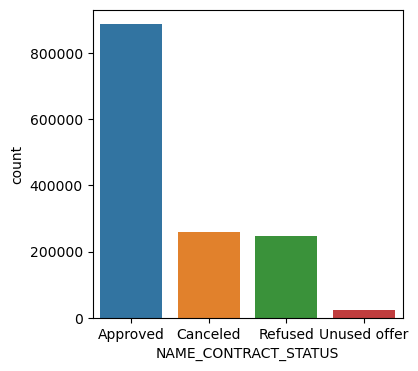

In [411]:
plt.figure(figsize=[4,4])
sns.countplot(df_merge['NAME_CONTRACT_STATUS'])
plt.show()

In [412]:
df_merge['NAME_CLIENT_TYPE'].value_counts().sort_values(ascending = False)

Repeater     1039225
New           259540
Refreshed     114936
Name: NAME_CLIENT_TYPE, dtype: int64

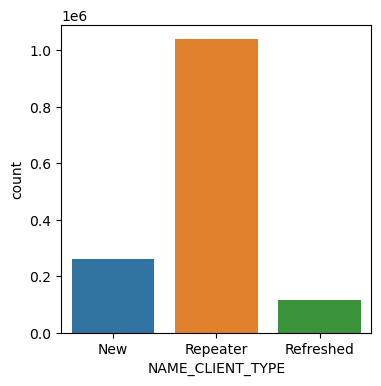

In [413]:
plt.figure(figsize=[4,4])
sns.countplot(df_merge['NAME_CLIENT_TYPE'])
plt.show()

In [414]:
df_merge['CHANNEL_TYPE'].value_counts().sort_values(ascending = False)

Credit and cash offices       600342
Country-wide                  423062
Stone                         183508
Regional / Local               92472
Contact center                 58891
AP+ (Cash loan)                49624
Channel of corporate sales      5396
Car dealer                       406
Name: CHANNEL_TYPE, dtype: int64

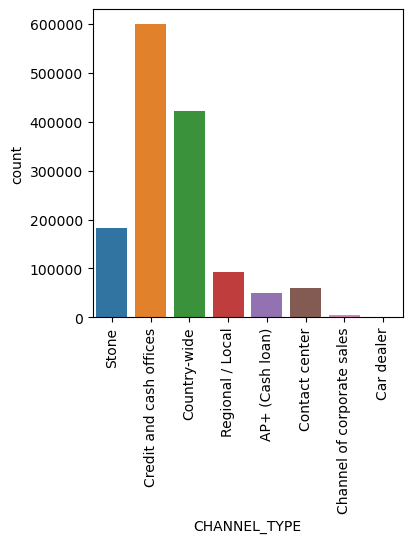

In [415]:
plt.figure(figsize=[4,4])
sns.countplot(df_merge['CHANNEL_TYPE'])
plt.xticks(rotation=90)
plt.show()

In [416]:
df_merge['NAME_YIELD_GROUP'].value_counts().sort_values(ascending = False)

XNA           429198
middle        324971
high          306061
low_normal    274884
low_action     78587
Name: NAME_YIELD_GROUP, dtype: int64

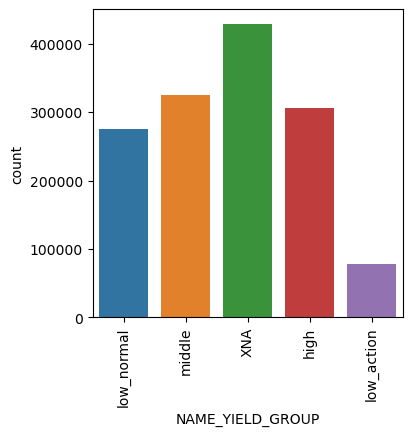

In [417]:
plt.figure(figsize=[4,4])
sns.countplot(df_merge['NAME_YIELD_GROUP'])
plt.xticks(rotation=90)
plt.show()

In [418]:
df_merge['NAME_GOODS_CATEGORY'].value_counts().sort_values(ascending = False).head()

XNA                     797209
Mobile                  193743
Consumer Electronics    104785
Computers                89923
Audio/Video              85502
Name: NAME_GOODS_CATEGORY, dtype: int64

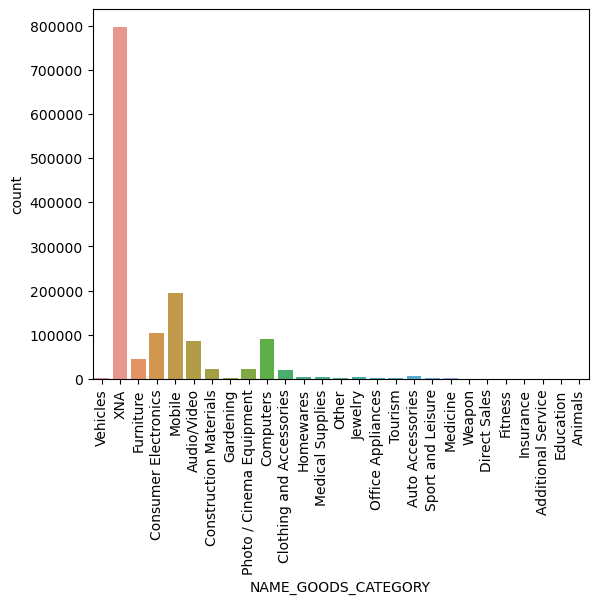

In [419]:
sns.countplot(df_merge['NAME_GOODS_CATEGORY'])
plt.xticks(rotation=90)
plt.show()

In [420]:
##Analysis of AMT_APPLICATION

In [421]:
Q1 = df_merge['AMT_APPLICATION'].quantile(0.25)
Q3 = df_merge['AMT_APPLICATION'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

160249.5


In [422]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -220623.75
Max value after which outlier exist: 420374.25


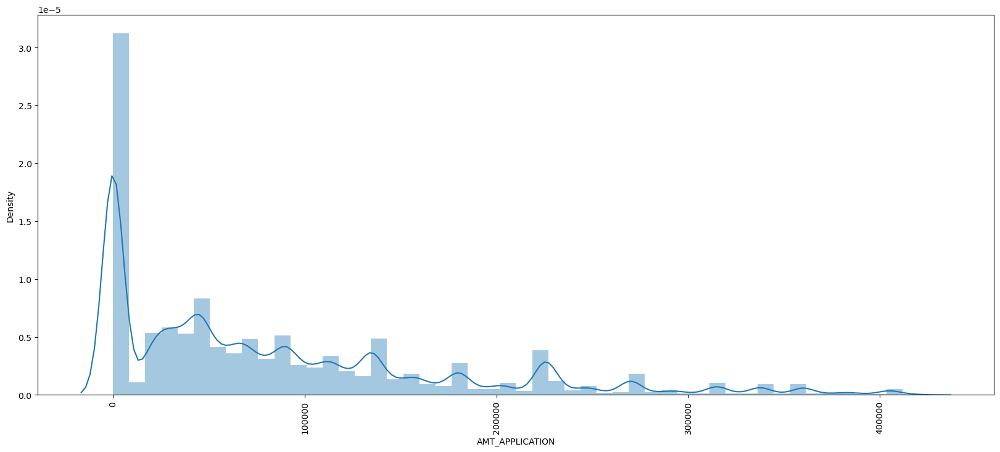

In [423]:
plt.figure(figsize=[20,8])
sns.distplot(df_merge[df_merge["AMT_APPLICATION"]<Max_value].AMT_APPLICATION,hist=True)
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='x')
plt.show()


In [424]:
##Analysis of AMT_ANNUITY_y

In [425]:
Q1 = df_merge['AMT_ANNUITY_y'].quantile(0.25)
Q3 = df_merge['AMT_ANNUITY_y'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

14162.917500000001


In [426]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -14986.518750000001
Max value after which outlier exist: 41665.15125


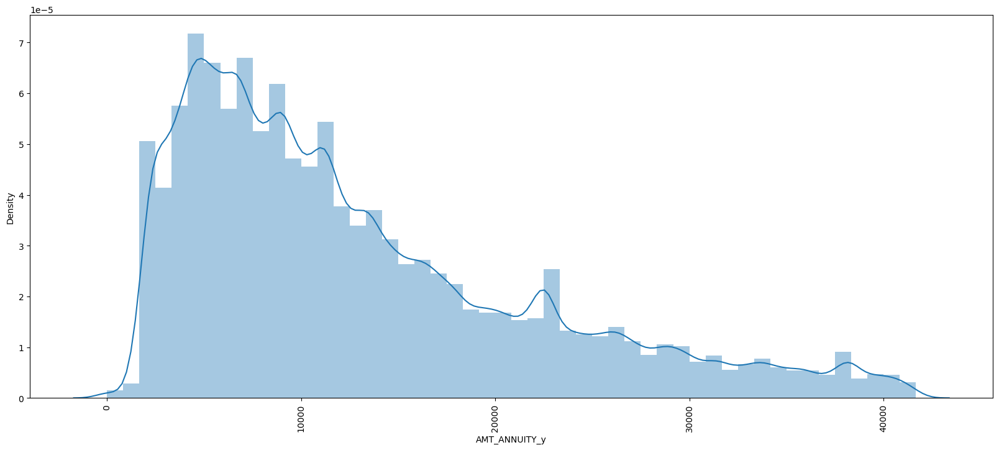

In [427]:
plt.figure(figsize=[20,8])
sns.distplot(df_merge[df_merge["AMT_ANNUITY_y"]<Max_value].AMT_ANNUITY_y,hist=True)
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='x')
plt.show()


In [428]:
Q1 = df_merge['AMT_CREDIT_y'].quantile(0.25)
Q3 = df_merge['AMT_CREDIT_y'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

190759.5


In [429]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -261258.75
Max value after which outlier exist: 501779.25


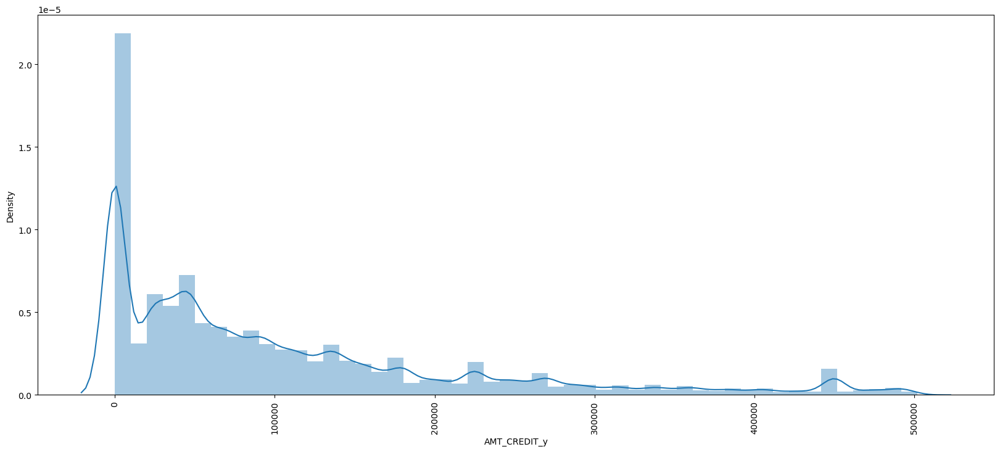

In [430]:
plt.figure(figsize=[20,8])
sns.distplot(df_merge[df_merge["AMT_CREDIT_y"]<Max_value].AMT_CREDIT_y,hist=True)
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='x')
plt.show()

In [431]:
Q1 = df_merge['AMT_GOODS_PRICE_y'].quantile(0.25)
Q3 = df_merge['AMT_GOODS_PRICE_y'].quantile(0.75)
IQR = Q3 - Q1
print(IQR)

179671.5


In [432]:
Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value before which outlier exist: {}".format(Min_value))
print("Max value after which outlier exist: {}".format(Max_value))

Min value before which outlier exist: -219678.75
Max value after which outlier exist: 499007.25


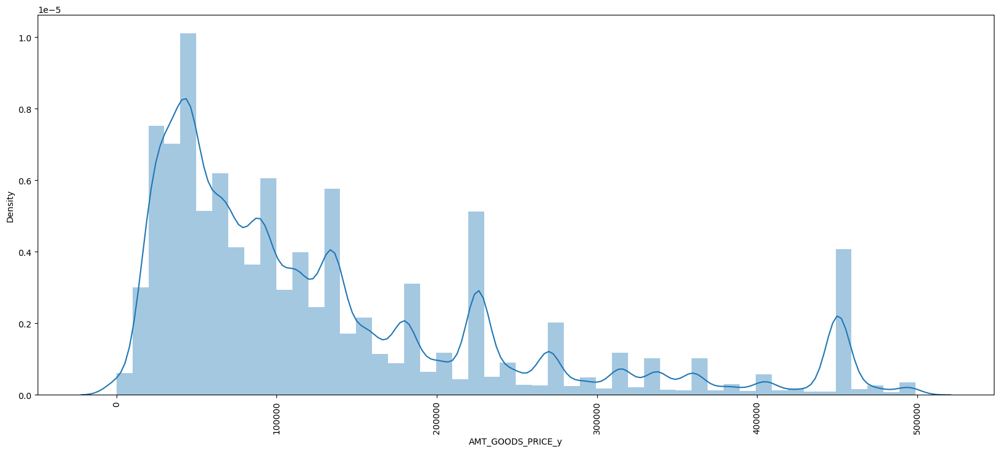

In [433]:
plt.figure(figsize=[20,8])
sns.distplot(df_merge[df_merge["AMT_GOODS_PRICE_y"]<Max_value].AMT_GOODS_PRICE_y,hist=True)
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='x')
plt.show()

# Correlation analysis of numerical variables

In [434]:
corr_df_prev = df_merge[['AMT_ANNUITY_x', 'AMT_APPLICATION','AMT_CREDIT_x', 'AMT_GOODS_PRICE_x',
                    'AMT_ANNUITY_y', 'AMT_CREDIT_y', 'AMT_GOODS_PRICE_y', 'CNT_PAYMENT']].corr()

In [435]:
corr_df_prev.head()

,AMT_ANNUITY_x,AMT_APPLICATION,AMT_CREDIT_x,AMT_GOODS_PRICE_x,AMT_ANNUITY_y,AMT_CREDIT_y,AMT_GOODS_PRICE_y,CNT_PAYMENT
AMT_ANNUITY_x,1.000000,0.112063,0.758441,0.762251,0.202537,0.107646,0.134160,-0.005500
AMT_APPLICATION,0.112063,1.000000,0.118809,0.120734,0.809972,0.975683,0.999871,0.683056
AMT_CREDIT_x,0.758441,0.118809,1.000000,0.986310,0.152961,0.116746,0.137746,0.037726
AMT_GOODS_PRICE_x,0.762251,0.120734,0.986310,1.000000,0.155065,0.117226,0.138942,0.036073
AMT_ANNUITY_y,0.202537,0.809972,0.152961,0.155065,1.000000,0.817977,0.822204,0.398084


In [436]:
##Plotting a heatmap to check the strength between various variables

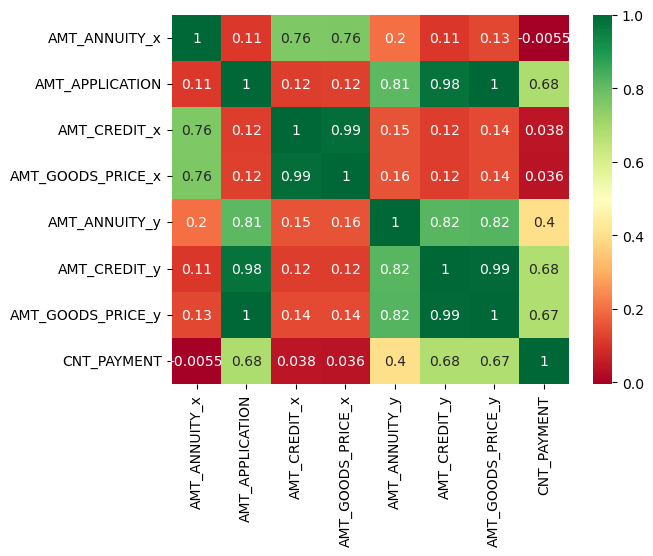

In [437]:
sns.heatmap(data=corr_df_prev,annot=True,cmap="RdYlGn",cbar=True)
plt.show()

# Bivariate/Multivariate analysis

In [438]:
##Continuous V/S Continuous variables

In [439]:
max_value1_AMT_GOODS_PRICE_y=499007.25

In [440]:
max_value1_AMT_CREDIT_y=501779.25

In [441]:
##Plotting Scatterplot

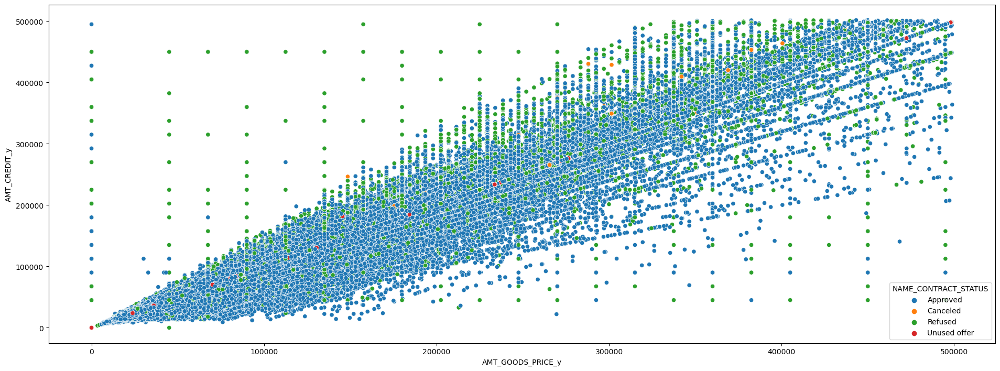

In [442]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_GOODS_PRICE_y'] < max_value1_AMT_GOODS_PRICE_y].AMT_GOODS_PRICE_y, 
                y = df_merge[df_merge['AMT_CREDIT_y'] < max_value1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()


In [443]:
max_1_AMT_ANNUITY_y=41665.15125

In [444]:
max_1_AMT_CREDIT_y=501779.25

In [445]:
##Plotting Scatterplot

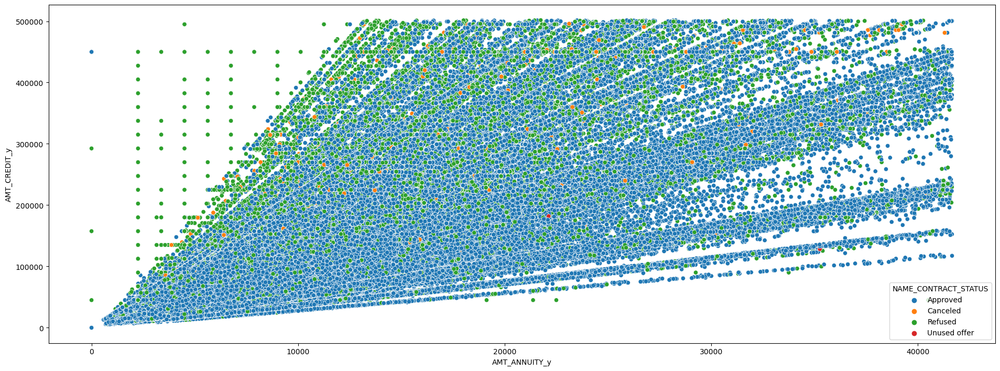

In [446]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_ANNUITY_y'] < max_1_AMT_ANNUITY_y].AMT_ANNUITY_y, 
                y = df_merge[df_merge['AMT_CREDIT_y'] < max_1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()


In [447]:
max_1_AMT_APPLICATION=420374.25

In [448]:
max_1_AMT_GOODS_PRICE_y=499007.25

In [449]:
##Plotting Scatterplot

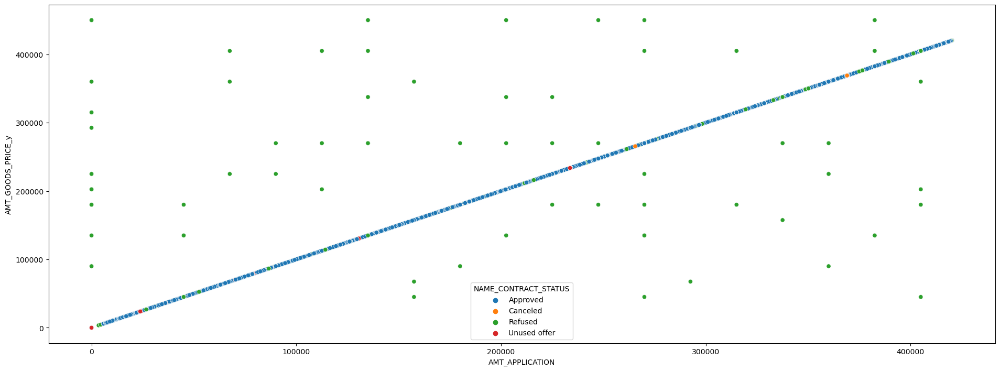

In [450]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_APPLICATION'] < max_1_AMT_APPLICATION].AMT_APPLICATION, 
                y = df_merge[df_merge['AMT_GOODS_PRICE_y'] < max_1_AMT_GOODS_PRICE_y].AMT_GOODS_PRICE_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

In [451]:
max_1_AMT_APPLICATION=420374.25

In [452]:
max_1_AMT_CREDIT_y=501779.25

In [453]:
##Plotting Scatterplot

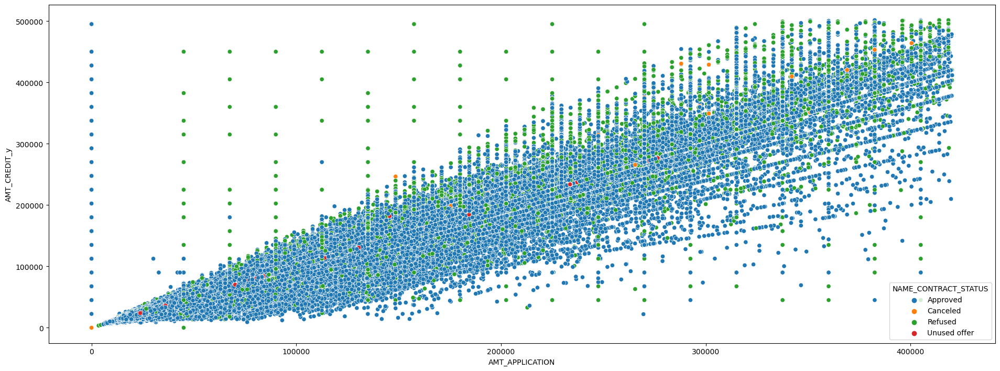

In [454]:
plt.figure(figsize = [20,8])

sns.scatterplot(x = df_merge[df_merge['AMT_APPLICATION'] < max_1_AMT_APPLICATION].AMT_APPLICATION, 
                y = df_merge[df_merge['AMT_CREDIT_y'] < max_1_AMT_CREDIT_y].AMT_CREDIT_y,
                data = df_merge,hue = 'NAME_CONTRACT_STATUS')
plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.tight_layout(pad = 4)
plt.show()

# Continuous V/S Categorical variables

In [455]:
def fn_bi_boxplot_merge(categorical,continuous,max_continuous,hue_column):
    plt.figure(figsize = [20,12])
    red_diamond = dict(markerfacecolor='r', marker='D')

    sns.boxplot(x = categorical, 
                y = df_merge[df_merge[continuous] < max_continuous][continuous], 
                data = df_merge, 
                flierprops = red_diamond, 
                order = sorted(df_merge[categorical].unique(), reverse = True),
                hue = hue_column, hue_order = sorted(df_merge[hue_column].unique(), reverse = True))
    plt.ticklabel_format(style='plain', axis='y')
    plt.xticks(rotation=90)

    plt.tight_layout(pad = 4)
    plt.show()

In [456]:
max_1_AMT_CREDIT_y=501779.25

In [457]:
df_merge.groupby(by=["NAME_CONTRACT_STATUS","CODE_GENDER"]).AMT_CREDIT_y.describe().head()

count           mean            std  min  \
NAME_CONTRACT_STATUS CODE_GENDER                                                
Approved             F            598648.0  207549.311783  279373.334031  0.0   
                     M            287450.0  189288.803455  267951.423666  0.0   
Canceled             F            179044.0   24215.178872  160577.583695  0.0   
                     M             80397.0   26053.062186  174648.755786  0.0   
Refused              F            163327.0  376530.997804  458660.510607  0.0   

                                          25%       50%       75%        max  
NAME_CONTRACT_STATUS CODE_GENDER                                              
Approved             F            48078.00000  104935.5  229500.0  4509688.5  
                     M            45430.61625   94140.0  197820.0  4050000.0  
Canceled             F                0.00000       0.0       0.0  3847104.0  
                     M                0.00000       0.0       0.0  3524220.0  
Refused              F            66159.00000  202500.0  513531.0  4085550.0

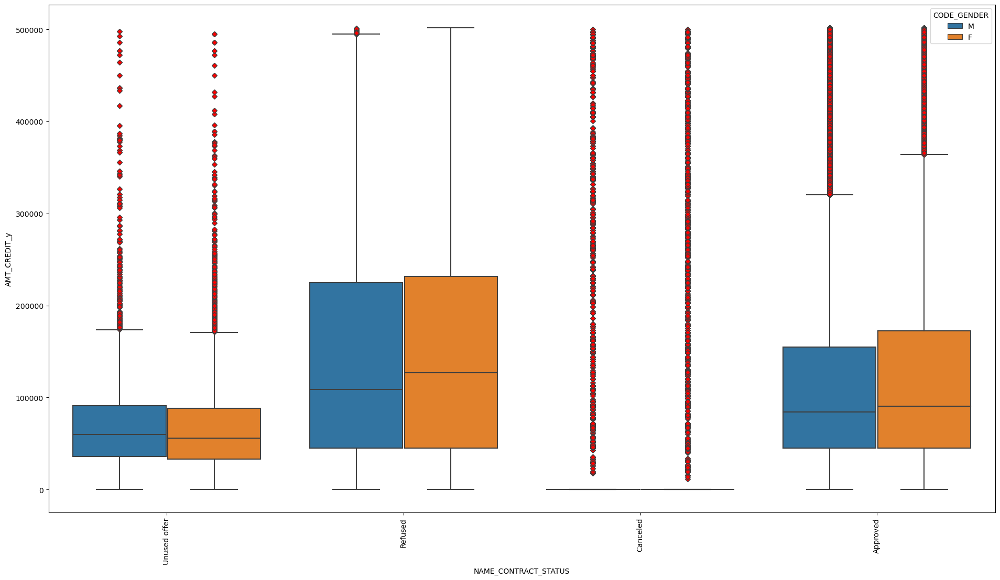

In [458]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_CREDIT_y',max_1_AMT_CREDIT_y,'CODE_GENDER')


Outlier identification of AMT_ANNUITY_y

In [459]:
max1_AMT_ANNUITY_y=41665.15125

In [460]:
df_merge.groupby(by = ['NAME_CONTRACT_STATUS','CODE_GENDER']).AMT_ANNUITY_y.describe().head()


count          mean           std  \
NAME_CONTRACT_STATUS CODE_GENDER                                         
Approved             F            598644.0  14660.846512  13624.355984   
                     M            287448.0  14513.242696  13996.128661   
Canceled             F              6073.0  28917.041110  17584.221541   
                     M              2687.0  33066.864965  19936.904912   
Refused              F            141148.0  20318.152592  16580.619818   

                                       min          25%         50%  \
NAME_CONTRACT_STATUS CODE_GENDER                                      
Approved             F               0.000   5927.98500  10424.6100   
                     M               0.000   5790.79125  10010.4075   
Canceled             F            1324.305  16236.18000  25409.7450   
                     M            1780.875  19257.16500  29550.6000   
Refused              F               0.000   8765.83125  15750.0000   

                                          75%         max  
NAME_CONTRACT_STATUS CODE_GENDER                           
Approved             F            18314.93250  393868.665  
                     M            17900.91000  229274.955  
Canceled             F            38133.00000  210950.865  
                     M            43799.46750  218713.545  
Refused              F            27512.04375  418058.145

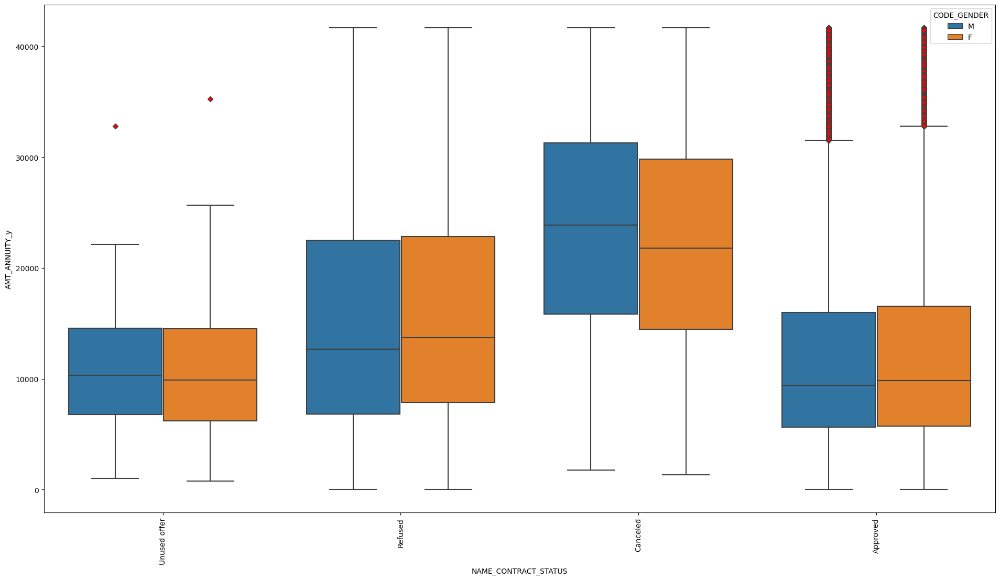

In [461]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_ANNUITY_y',max1_AMT_ANNUITY_y,'CODE_GENDER')

In [462]:
max1_AMT_GOODS_PRICE_y=499007.25

In [463]:
df_merge.groupby(by = ['NAME_CLIENT_TYPE','NAME_CONTRACT_STATUS']).AMT_GOODS_PRICE_y.describe().head()

count           mean            std  \
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                                           
New              Approved              242297.0  103479.305513  137367.958950   
                 Canceled                 186.0  481775.177419  576602.841868   
                 Refused                12219.0  169230.614094  280373.275781   
                 Unused offer            1867.0   79936.321020   61318.331628   
Refreshed        Approved               79838.0  188335.881616  245136.327024   

                                           min       25%          50%  \
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                                   
New              Approved                  0.0   38106.0   67500.0000   
                 Canceled              22455.0  135000.0  225000.0000   
                 Refused                   0.0   45000.0   97452.0000   
                 Unused offer              0.0   39325.5   66758.8500   
Refreshed        Approved                  0.0   54859.5  106469.8875   

                                             75%        max  
NAME_CLIENT_TYPE NAME_CONTRACT_STATUS                        
New              Approved              121500.00  5850000.0  
                 Canceled              675000.00  3150000.0  
                 Refused               180000.00  4050000.0  
                 Unused offer          104231.25   688059.0  
Refreshed        Approved              219150.00  3150000.0

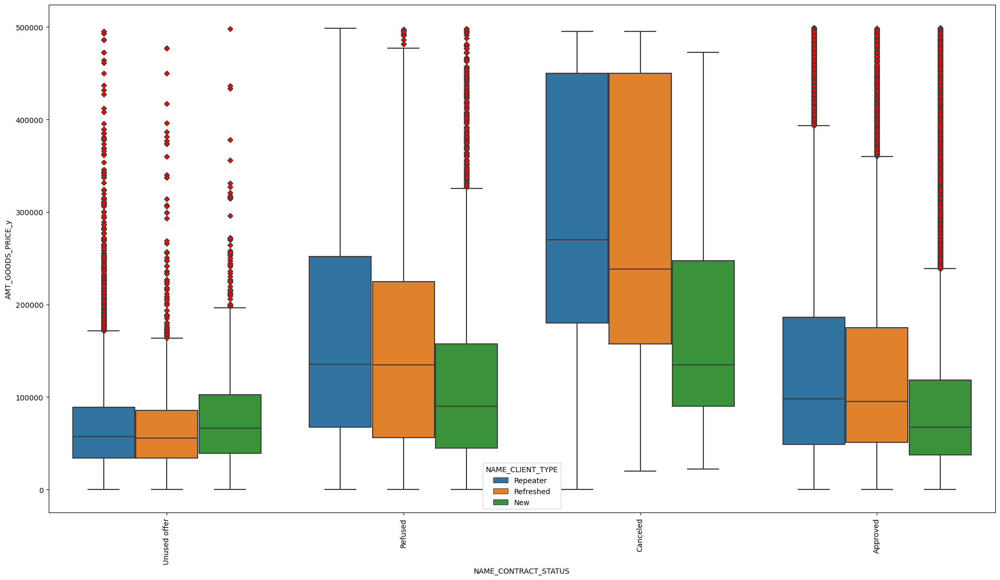

In [464]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_GOODS_PRICE_y',max1_AMT_GOODS_PRICE_y,'NAME_CLIENT_TYPE')

In [465]:
max_1_AMT_CREDIT_y

501779.25

In [466]:
df_merge.groupby(by = ['NAME_PORTFOLIO','NAME_CONTRACT_STATUS']).AMT_CREDIT_y.describe().head()

count          mean            std  \
NAME_PORTFOLIO NAME_CONTRACT_STATUS                                         
Cards          Approved              82407.0  2.276054e+05  215931.325545   
               Canceled                417.0  2.287338e+05  186123.227075   
               Refused               39159.0  2.397627e+05  207093.853558   
               Unused offer              1.0  2.025000e+05            NaN   
Cars           Approved                241.0  1.122764e+06  644748.216327   

                                          min       25%       50%        75%  \
NAME_PORTFOLIO NAME_CONTRACT_STATUS                                            
Cards          Approved                   0.0   67500.0  157500.0   292500.0   
               Canceled               45000.0  112500.0  180000.0   270000.0   
               Refused                    0.0   90000.0  180000.0   270000.0   
               Unused offer          202500.0  202500.0  202500.0   202500.0   
Cars           Approved              202500.0  735520.5  980100.0  1293556.5   

                                           max  
NAME_PORTFOLIO NAME_CONTRACT_STATUS             
Cards          Approved              1350000.0  
               Canceled               900000.0  
               Refused               2250000.0  
               Unused offer           202500.0  
Cars           Approved              4509688.5

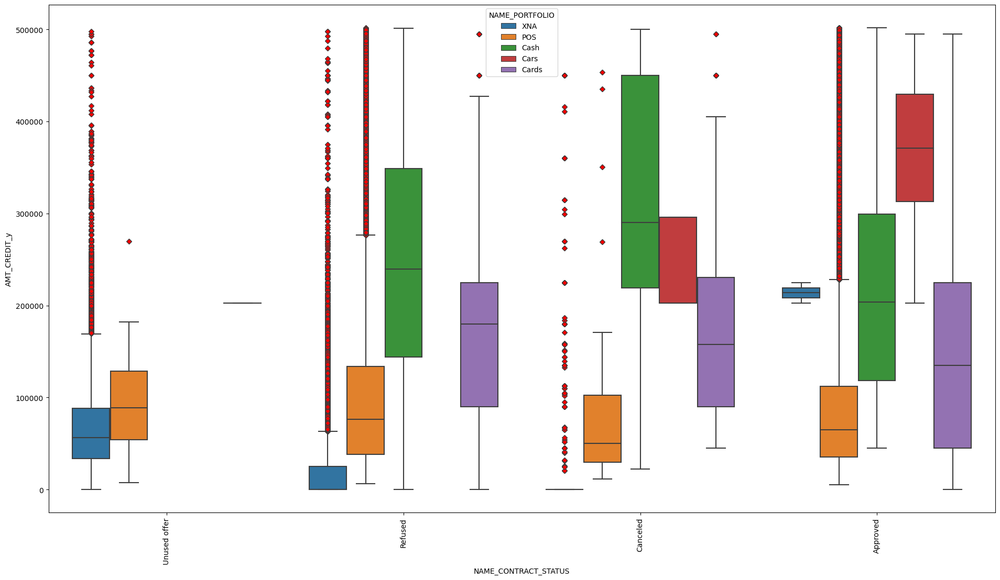

In [467]:
fn_bi_boxplot_merge('NAME_CONTRACT_STATUS','AMT_CREDIT_y',max_1_AMT_CREDIT_y,'NAME_PORTFOLIO')


# Categorical V/S Categorical variables

In [468]:
def fn_bi_countplot_merge(column,hue_column):
    plt.figure(figsize = [20,8])
    palt = sns.color_palette("bright")

    sns.countplot(x = column, data = df_merge, 
                  order = sorted(df_merge[column].unique()), palette = palt,
                  hue = hue_column, hue_order = sorted(df_merge[hue_column].unique(), reverse = True))
    plt.xticks(rotation = 90)

    plt.tight_layout(pad = 4)
    plt.show()

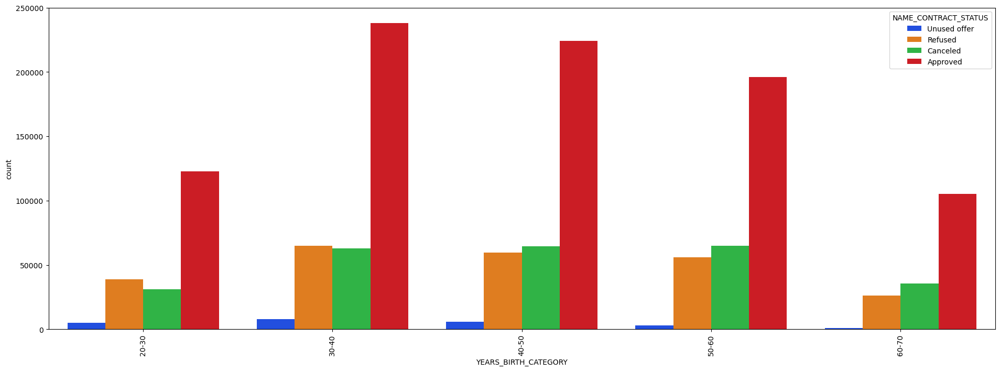

In [469]:
fn_bi_countplot_merge('YEARS_BIRTH_CATEGORY','NAME_CONTRACT_STATUS')

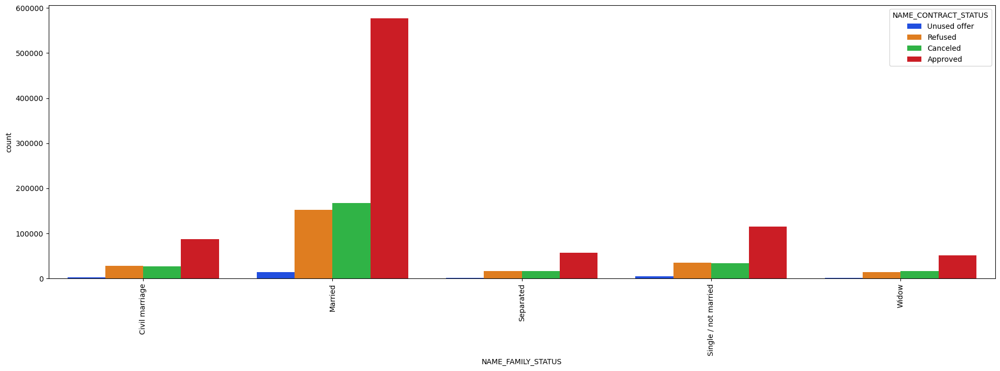

In [470]:
fn_bi_countplot_merge('NAME_FAMILY_STATUS','NAME_CONTRACT_STATUS')

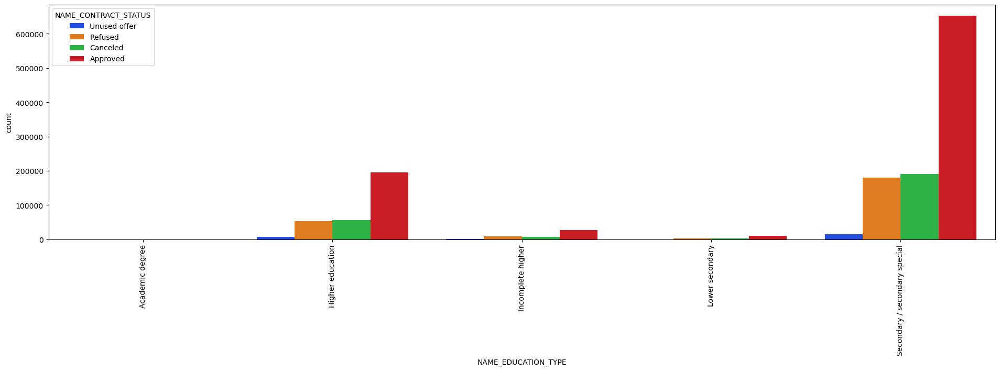

In [471]:
fn_bi_countplot_merge('NAME_EDUCATION_TYPE','NAME_CONTRACT_STATUS')

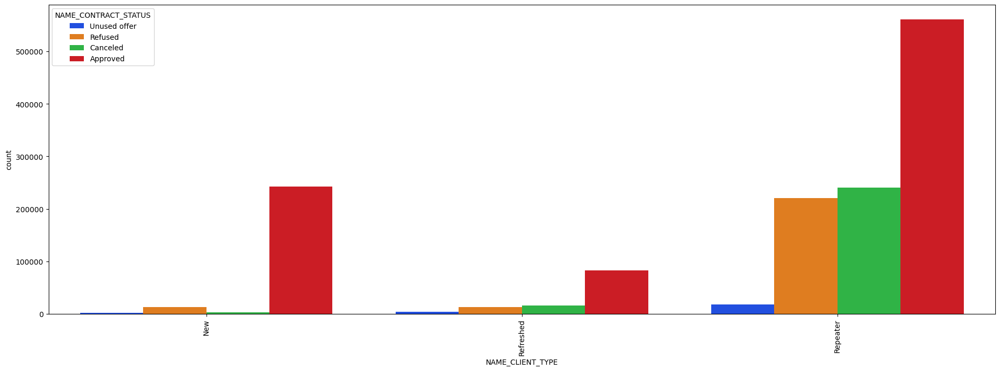

In [472]:
fn_bi_countplot_merge('NAME_CLIENT_TYPE','NAME_CONTRACT_STATUS')

# conclusion:Clients we should target more